# Using:

* TESS data (reprocessed / Vanderburgs)
* Cheops data
* Saint-Ex data 
* 4-band data from MUSCAT

While also including:
* TTVs 
* Dynamic modelling/masses
* Detrending parameters (for each Cheops transit and Saint-Ex and MUSCAT data)

And then repeating this for both the 25.1 & 35.1d periods

In [1]:
import pandas as pd
import aesara_theano_fallback.tensor as tt
import exoplanet as xo
import gzip

import pymc3 as pm
import pymc3_ext as pmx
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import pickle
import seaborn as sns
from astropy.io import ascii
from datetime import date
date.today().strftime("%Y%m%d")
sns.set_style('whitegrid')
sns.set_palette('viridis')

Matplotlib created a temporary config/cache directory at /var/folders/p0/tmr0j01x4jb3qrbc5b0gnxcw0000gn/T/matplotlib-llt270_c because the default path (/Users/hosborn/.matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [27]:
save_loc="/Volumes/LUVOIR/Cheops_data/TOI2076/CombModelOutputs/"

# Which of the two periods to use
p=35 #88#25#35#88 #25 #35 #88

# Whether to assume a circular orbit
circular=True

# Whether to include a GP for the Cheops roll-angle correction
cheops_gp=False

#Distance in TESS lc (in durations) above which to cut:
cutDistance = 2.5

# Which parameters to include as linear and quadratic decorrelation terms
incl_quad={'cheops_0':['norm_time'],'cheops_1':['norm_time'],'cheops_2':['norm_time'],'cheops_3':['norm_time']}
incl_lin={'cheops_0':['norm_time', 'cos_phi', 'bg'],
          'cheops_1':['norm_time','sin_phi', 'cos_phi', 'smear', 'bg'],
          'cheops_2':['norm_time','sin_phi', 'cos_phi','bg'],
          'cheops_3':['norm_time', 'cos_phi', 'smear', 'bg']}

scopes_w_transit=['tess','cheops_1','cheops_3']
if p==35:
    incl_lin.update({'g_lco':['airmass','entropy','norm_time','width','g/r','r/i'],
                      'r_lco':['airmass','norm_time','width','g/r','r/i'],
                      'i_lco':['airmass','entropy','norm_time','width','compcounts','r/i','i/z'],
                      'z_lco':['airmass','norm_time','width','r/i','i/z'],
                      'r_sex':['airmass','compcounts'],
                      'z_mcd':['airmass']})
    incl_quad.update({'g_lco':['airmass'],'r_lco':['airmass'],'i_lco':['airmass'],'z_lco':['airmass'],'r_sex':['airmass'],
           'z_mcd':[]})
    scopes_w_transit+=['g_lco', 'r_lco', 'i_lco', 'z_lco', 'r_sex']
if p==25 or p==88:
    incl_lin.update({'g_lco':['airmass','entropy','norm_time','width','g/r','r/i'],
                      'r_lco':['airmass','entropy','norm_time','width','g/r','r/i'],
                      'i_lco':['airmass','norm_time','width','compcounts','r/i','i/z'],
                      'z_lco':['airmass','entropy','norm_time','width','r/i','i/z'],
                      'r_sex':['airmass','compcounts'],
                      'z_mcd':['airmass']})
    incl_quad.update({'g_lco':['airmass'],'r_lco':['airmass'],'i_lco':[],'z_lco':[],'r_sex':['airmass'],
           'z_mcd':[]})
    if p==25:
        scopes_w_transit+=['z_mcd']
# Whether to account for contamination in each band (this may have already been accounted for)
no_contam=True

# Whether to constrain LDs from theoretical values, or whether to fit without any prior
constrain_LDs=True

# Whether to run the model with a goal of correct planetary parameters (i.e. excluding non-transiting data)
pl_params_only=False

#Start off with past data positions (e.g. for detrending)?
use_past = False

comment="35d_fixed_ror_vals"

filename='P'+str(p)+'_'+np.array(['ecc','circ'])[int(circular)] + \
         '_'+''.join([var[0] for var in incl_lin['cheops_0']])+''.join([var[0] for var in incl_lin['g_lco']]) + \
         '_'+''.join([var[0] for var in incl_quad['cheops_0']])+''.join([var[0] for var in incl_quad['g_lco']]) + \
         '_'+np.array(['nogp','gp'])[int(cheops_gp)]+'_'+np.array(['contam','nocontam'])[int(no_contam)]+\
         '_'+np.array(['freeld','fixld'])[int(constrain_LDs)]+'_'+comment+'_'+date.today().strftime("%Y%m%d")
print(filename)

P35_circ_ncbaenwgr_na_nogp_nocontam_fixld_35d_fixed_ror_vals_20211205


In [2]:
alldata = pickle.load(open("all_data_for_combined_model.pkl","rb"))

In [4]:
from astropy.time import Time

In [28]:
def weighted_avg_and_std(values, weights):
    """
    Return the weighted average and standard deviation.

    values, weights -- Numpy ndarrays with the same shape.
    """
    average = np.average(values, weights=weights)
    # Fast and numerically precise:
    variance = np.average((values-average)**2, weights=weights)
    return (average, np.sqrt(variance))
weighted_avg_and_std(np.array([250,420]),np.array([120,130]))

(338.4, 84.93197277821821)

In [ ]:
weighted_avg_and_std

In [21]:
#Start time [UT] & Start time [BJD] &  Duration [hrs] & File ref & Exp [s] & cadence [s] & planet & per. aliases [d]\\

tabscope={"cheops_3":["Cheops visit 1",42.0,'c','21.014d','CH_PR110048_TG002501_V0200','--'],
          "cheops_2":["Cheops visit 2",42.0,'d','43.907d','CH_PR110048_TG003201_V0200','--'],"cheops_1":["Cheops visit 3",42.0,'b','--','CH_PR110048_TG003601_V0200','--'],
          "z_mcd":["LCO/Sinistro (z')",36.0,'d','25.090d','--'],
          "cheops_0":["Cheops visit 4",42.0,'d','29.3 \& 58.5d','CH_PR110048_TG003701_V0200'],
          "r_sex":["Saint-Ex (r')",8.0,'d','35.125d','--'],
          "g_lco":["LCO/MuSCAT3 (g')",37.0,'d','35.125d','--'],"r_lco":["LCO/MuSCAT3 (r')",21.0,'d','35.125d','--'],
          "i_lco":["LCO/MuSCAT3 (i')",19.0,'d','35.125d','--'],"z_lco":["LCO/MuSCAT3 (z')",25.0,'d','35.125d','--']}
for scope in tabscope:
    if 'time' in alldata[scope]:
        print(tabscope[scope][0],'&',
              Time(2457000+alldata[scope]['time'][0],format='jd').strftime("%Y-%m-%d %H:%M:%S%z"),'&',
              np.round(2457000+alldata[scope]['time'][0],5),' & ',
              np.round(24*(alldata[scope]['time'][-1]-alldata[scope]['time'][0]),3),'&',
              tabscope[scope][1],' &',
              np.round(86400*np.nanmedian(np.diff(alldata[scope]['time'])),1),
              '& ',tabscope[scope][2],' & ',tabscope[scope][3],' & ',tabscope[scope][4],'\\\\')

Cheops visit 1 & 2021-02-28 09:02:04 & 2459273.87644  &  8.884 & 42.0  & 42.0 &  c  &  21.014d  &  CH_PR110048_TG002501_V0200 \\
Cheops visit 2 & 2021-04-28 18:41:46 & 2459333.27901  &  10.553 & 42.0  & 42.0 &  d  &  43.907d  &  CH_PR110048_TG003201_V0200 \\
Cheops visit 3 & 2021-04-29 07:13:25 & 2459333.80099  &  9.771 & 42.0  & 42.0 &  b  &  10.355d  &  CH_PR110048_TG003601_V0200 \\
LCO/Sinistro (z') & 2021-05-05 02:40:12 & 2459339.61126  &  5.804 & 36.0  & 44.9 &  d  &  25.090d  &  -- \\
Cheops visit 4 & 2021-05-13 10:17:08 & 2459347.92857  &  10.168 & 42.0  & 42.0 &  d  &  29.271 \& 58.542d  &  CH_PR110048_TG003701_V0200 \\
Saint-Ex (r') & 2021-05-25 03:17:19 & 2459359.63704  &  3.21 & 8.0  & 23.7 &  d  &  35.125d  &  -- \\
LCO/MuSCAT3 (g') & 2021-06-29 06:07:49 & 2459394.75544  &  4.75 & 37.0  & 42.3 &  d  &  35.125d  &  -- \\
LCO/MuSCAT3 (r') & 2021-06-29 06:07:41 & 2459394.75534  &  4.75 & 21.0  & 26.1 &  d  &  35.125d  &  -- \\
LCO/MuSCAT3 (i') & 2021-06-29 06:07:36 & 2459394.7

In [12]:
from astropy.io import fits

In [13]:
f=fits.open("/Volumes/LUVOIR/Cheops_data/SaintEx/20210524/Raw/20210525-033456-TOI-2076-S001-R001-C054-r'.fts")

In [14]:
f[0].header

SIMPLE  =                    T                                                  
BITPIX  =                   16 /8 unsigned int, 16 & 32 int, -32 & -64 real     
NAXIS   =                    2 /number of axes                                  
NAXIS1  =                 2048 /fastest changing axis                           
NAXIS2  =                 2088 /next to fastest changing axis                   
BSCALE  =   1.0000000000000000 /physical = BZERO + BSCALE*array_value           
BZERO   =   32768.000000000000 /physical = BZERO + BSCALE*array_value           
DATE-OBS= '2021-05-25T03:34:56.240' / [ISO 8601] UTC date/time of exposure start
EXPTIME =   8.00000000000E+000 / [sec] Duration of exposure                     
EXPOSURE=   8.00000000000E+000 / [sec] Duration of exposure                     
SET-TEMP=  -70.000000000000000 /CCD temperature setpoint in C                   
CCD-TEMP=  -70.809997558593750 /CCD temperature at start of exposure in C       
XPIXSZ  =   13.5000000000000

In [7]:
        Start time [UT] & Start time [BJD] &  Duration [hrs] & File ref & Exp [s] & cadence [s] & per. aliases [d]\\
        \hline
        LCO/MuSCAT3 (g' band) & 2459394.7554370346 & 2021-06-29T06:07:49.760 & 4.749579157680273 & & 42.30751544237137 \\
        LCO/MuSCAT3 (r' band) & 2459394.755337348 & 2021-06-29T06:07:41.147 & 4.750495903193951 & & 26.06527805328369 \\
        LCO/MuSCAT3 (i' band) & 2459394.755279378 & 2021-06-29T06:07:36.138 & 4.755504380911589 & & 24.060943722724915 \\
        LCO/MuSCAT3 (z' band)  & 2459394.7553604953 & 2021-06-29T06:07:43.147 & 4.748825591057539 & & 28.06961238384247 \\
        Saint-Ex (r' band)  & 2459359.637037 & 2021-05-25T03:17:19.997 & 3.2100720000453293 & & 23.673600470647216 \\
        LCO/Sinistro (z' band) & 2459339.61126 & 2021-05-05T02:40:12.864 & 5.803847998380661 & & 44.92802023887634 \\
        tess & 2458738.6492372146 & 2019-09-12T03:34:54.095 & 5189.496871714324 & & 119.99948333250359 \\
        Cheops V1 & 2459273.876437416 & 2021-02-28T09:02:04.193 & 8.884302958846092 & & 42.028579115867615 \\
        Cheops V2 & 2459333.2790054837 & 2021-04-28T18:41:46.074 & 10.553105313330889 & & 42.02600419521332 \\
        Cheops V3 & 2459333.8009941736 & 2021-04-29T07:13:25.897 & 9.770956009626389 & & 42.025963962078094 \\
        Cheops V4 & 2459347.9285738 & 2021-05-13T10:17:08.776 & 10.167733501642942 & & 42.02544093132019 \\

'2021-06-29T06:07:49.760'

In [29]:
'''
past_modelling=pd.read_csv("/Volumes/LUVOIR/MonoToolsData/TIC00027491137/TIC00027491137_2021-06-29_1_mcmc_output_short.csv",index_col=0)
if p==25 or p==88:
    past_ground_modelling=pickle.load(open("decorr_without_transit(logp=-86.4).pkl",'rb'))
elif p==35:
    past_ground_modelling=pickle.load(open("decorr_with_transit(logp=-74.9).pkl",'rb'))
'''
past_modelling={};past_ground_modelling={}
#Initialising past ground-based decorrelation params:

if pl_params_only:
    ground_scopes=[gs for gs in ['g_lco','r_lco','i_lco','z_lco','r_sex'] if gs in scopes_w_transit]
else:
    ground_scopes=['g_lco','r_lco','i_lco','z_lco','r_sex','z_mcd']

past_linears={gs:{} for gs in ground_scopes}
past_quads={gs:{} for gs in ground_scopes}

varrenaming={'norm_time':'TIME','airmass':'AIRMASS','width':'WIDTH','compcounts':'COMPCOUNTS'}
for ns,scope in enumerate(ground_scopes):
    for var in incl_lin[scope]:
        if var in varrenaming and 'dfd'+varrenaming[var] in past_ground_modelling and use_past:
            past_linears[scope][var]=past_ground_modelling['dfd'+varrenaming[var]][ns]
        else:
            past_linears[scope][var]=np.random.normal(0.0,0.5)
        if type(incl_quad)==dict and var in incl_quad[scope] and 'd2fd'+varrenaming[var]+'2' in past_ground_modelling and use_past:
            past_quads[scope][var]=past_ground_modelling['d2fd'+varrenaming[var]+'2'][ns]
        elif type(incl_quad)==dict and var in incl_quad[scope]:
            past_quads[scope][var]=np.random.normal(0.0,0.5)
#Initialising past cheops decorrelation params:
chscopes=range(4) if not pl_params_only else [1,3]
for nch in chscopes:
    past_linears['cheops_'+str(nch)]={var:np.random.normal(0.0,0.2) for var in incl_lin['cheops_'+str(nch)]}
    if type(incl_quad)==dict:
        past_quads['cheops_'+str(nch)]={var:np.random.normal(0.0,0.2) for var in incl_quad['cheops_'+str(nch)]}

if 'z_mcd' in ground_scopes:
    past_linears['z_mcd']={var:np.random.normal(0.0,0.2) for var in incl_lin['z_mcd']}
    past_quads['z_mcd']={var:np.random.normal(0.0,0.2) for var in incl_quad['z_mcd']}
past_linears['tess']={}
past_quads['tess']={}

### Preparing the TESS lightcurve

Let's use the planet parameters to clip the TESS timeseries (and flatten the TESS lightcurve)

In [30]:
all_cheops_y=np.hstack([alldata['cheops_'+str(n)]['flux'] for n in chscopes])
decor_scopes=ground_scopes+['cheops_'+str(n) for n in chscopes]
all_scopes=decor_scopes+['tess']
all_filts=np.unique([gs.split('_')[0] for gs in all_scopes])

In [31]:
#from MonoTools.MonoTools import lightcurve,tools
#lc=lightcurve.multilc(4646810,'tess',load=True)
past_modelling=pd.read_csv('/Volumes/LUVOIR/Cheops_data/TOI2076/CombModelOutputs/TOI2076_finalmodel_P35_circ_ncbaenwgr_na_nogp_nocontam_fixld_add_parameter_groups_pmxsample_20211125_results.csv',index_col=0)
#"/Volumes/LUVOIR/MonoToolsData/TIC00027491137/TIC00027491137_2021-06-29_1_mcmc_output_short.csv",index_col=0)

alldata['tess']['in_trans']   = np.tile(False,len(alldata['tess']['time']))
alldata['tess']['near_trans'] = np.tile(False,len(alldata['tess']['time']))
for nfk in range(4):
    alldata['cheops_'+str(nfk)]['in_trans'] = np.tile(False,len(alldata['cheops_'+str(nfk)]['time']))

init_transit_times={}
init_transit_inds={}
info={}

for pl in range(3):
    info[pl]={}
    info[pl]['t0']=past_modelling.loc['t0['+str(pl)+']','mean']
    if pl==0:
        info[pl]['p']=past_modelling.loc['derived_period['+str(pl)+']','mean']
    elif pl==1:
        info[pl]['p']=past_modelling.loc['derived_period['+str(pl)+']','mean']
    else:
        if p==25:
            info[pl]['p']=(1938.2899096646295-1762.6651396199247)/7
        elif p==35:
            info[pl]['p']=past_modelling.loc['derived_period['+str(pl)+']','mean']
        elif p==88:
            info[pl]['p']=(1938.2899096646295-1762.6651396199247)/2
    info[pl]['dur'] = np.random.normal(past_modelling.loc['tdur['+str(pl)+']','mean'],
                                       2.5*past_modelling.loc['tdur['+str(pl)+']','sd'])/24
    tess_phase=abs((alldata['tess']['time']-info[pl]['t0']-0.5*info[pl]['p'])%info[pl]['p']-0.5*info[pl]['p'])
    alldata['tess']['in_trans']+=tess_phase<0.55*info[pl]['dur']
    alldata['tess']['near_trans']+=tess_phase<cutDistance*info[pl]['dur']
    for nfk in range(4):
        cheops_phase=abs((alldata['cheops_'+str(nfk)]['time']-info[pl]['t0']-0.5*info[pl]['p'])%info[pl]['p']-0.5*info[pl]['p'])
        alldata['cheops_'+str(nfk)]['in_trans']+=abs(cheops_phase)<0.55*info[pl]['dur']
    
    # Getting the transit time centres:
    tcens=info[pl]['t0']+np.arange(-100,150)*info[pl]['p']
    ix=np.min(abs(tcens[:,None]-np.hstack([alldata[scope]['time'] for scope in all_scopes])[None,:]),axis=1)<info[pl]['dur']*0.65
    init_transit_times[pl]=tcens[ix]
    init_transit_inds[pl]=np.arange(-100,150)[ix]
    init_transit_inds[pl]-=np.min(init_transit_inds[pl])


In [32]:
from MonoTools.MonoTools import tools

lcdic={'time':np.array(list(alldata['tess']['time'][:])),
       'flux':np.array(list(alldata['tess']['flux'][:])),
       'flux_err':np.array(list(alldata['tess']['flux_err'][:])),
       'flux_unit':1}
print(np.nanstd(lcdic['flux']),np.nanmedian(lcdic['flux']),np.nanstd(lcdic['flux_err']),np.nanmedian(lcdic['flux_err']))
lcdic['mask']=tools.maskLc(lcdic,'')
print(np.nanstd(lcdic['flux']),np.nanmedian(lcdic['flux']),np.nanstd(lcdic['flux_err']),np.nanmedian(lcdic['flux_err']))
#lcdic['flux']=lcdic['flux']-0.001
#lcdic['flux_err']/=1e6

mod,_=tools.kepler_spline(alldata['tess']['time'][:],alldata['tess']['flux'][:],
                    flux_mask=lcdic['mask'],
                    transit_mask=~alldata['tess']['in_trans'][:])
#lcdic=tools.lcFlatten(lcdic, transit_mask=~alldata['tess']['in_trans'][:])#['spline']
alldata['tess']['flux_flat']=alldata['tess']['flux']-mod
alldata['tess']['mask']=lcdic['mask']

alldata['tess']['time']     = alldata['tess']['time'][alldata['tess']['mask']&alldata['tess']['near_trans']]
alldata['tess']['flux']     = alldata['tess']['flux'][alldata['tess']['mask']&alldata['tess']['near_trans']]
alldata['tess']['flux_err'] = alldata['tess']['flux_err'][alldata['tess']['mask']&alldata['tess']['near_trans']]

0.5666230382743256 0.0 0.04871965510449328 0.4168251864494
0.5666143923829033 -1.525863023266183e-05 0.048718911709290984 0.4168188262680083


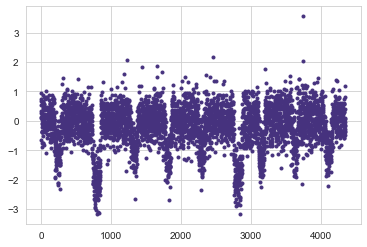

In [33]:
plt.plot(alldata['tess']['flux'],'.')

In [34]:
np.array([info[pl]['p'] for pl in info])

array([10.35503107, 21.01558976, 35.12485869])

In [35]:
#init_periods =  np.array([info[pl]['p'] for pl in info])

with pm.Model() as combined_model:
    Teff = pm.Bound(pm.Normal, lower=4000,upper=6000)("Teff",mu=alldata['star']['teff'], sd=alldata['star']['teff_err'])
    #Ms = pm.Bound(pm.Normal, lower=0)("Ms",mu=iMstar[0], sd=iMstar[1])
    Rs = pm.Bound(pm.Normal, lower=0)("Rs",mu=alldata['star']['rad'], sd=alldata['star']['rad_err'])
    logg = pm.Normal("logg",mu=alldata['star']['logg'],sd=alldata['star']['logg_err'])
    #logg = pm.Deterministic("logg",tt.log10(Ms/Rs**2)+4.41)
    Ms = pm.Deterministic("Ms",tt.power(10,logg-4.41)*Rs**2)
    
    if no_contam:
        mults={scope:1.0 for scope in all_scopes}
    else:
        delta_mag_contams={pm.Normal("delta_mag_contam_"+scope, mu=alldata['star']['contam'][scope][0], sd=alldata['star']['contam_err'][scope][1]) for scope in all_scopes}
        mults={pm.Deterministic("mult_"+scope,(1+tt.power(2.511,-1*delta_mag_contams[scope]))) for scope in all_scopes}
    #deltaImag_contam = pm.Normal("deltaImag_contam", mu=5.2, sd=0.5)
    tess_mult = 1.0 #pm.Deterministic("tess_mult",(1+tt.power(2.511,-1*deltaImag_contam))) #Factor to multiply normalised lightcurve by
    
    #deltaVmag_contam = pm.Uniform("deltaVmag_contam", upper=12, lower=5)
    cheops_mult = 1.0#pm.Deterministic("cheops_mult",(1+tt.power(2.511,-1*deltaVmag_contam))) #Factor to multiply normalised lightcurve by

    # Gaussian priors based on transit data
    transit_times = {}
    for pl in range(3):
        transit_times[pl]=pm.Normal("transit_times_"+str(pl), mu=init_transit_times[pl], sd=0.025,
                                    shape=len(init_transit_times[pl]), testval=init_transit_times[pl])
    
    # Wide log-normal prior for semi-amplitude

    logror = pm.Normal("logror", mu=np.array([np.random.normal(np.log(past_modelling.loc['r_pl['+str(n)+']','mean']/(109.1*0.77)), 4*past_modelling.loc['r_pl['+str(n)+']','sd']/past_modelling.loc['r_pl['+str(n)+']','mean']) for n in range(3)]),
                       sd=np.tile(1,3), shape=3)
    ror = pm.Deterministic("ror",tt.exp(logror))
    r_pl = pm.Deterministic("r_pl",109.1*ror*Rs)
    b = pm.Uniform('b',lower=0.0,upper=1.0,shape=3)
    #xo.distributions.ImpactParameter("b", ror=ror, shape=3, 
        #                                 testval=np.array([np.clip(np.random.normal(past_modelling.loc['b_0'+str(n),'mean'],0.1),0,0.95) for n in range(3)]))
    u_star_filts={}
    u_star_scopes={}
    logs_phot={}
    filt_list={}
    for filttype in all_filts:
        if constrain_LDs:
            #u_star_filts[filttype]=pm.Bound(pm.Normal, 
            #                                lower=np.nanpercentile(alldata['lds'][filttype],1,axis=0), 
            #                                upper=np.nanpercentile(alldata['lds'][filttype],99,axis=0))("u_star_"+filttype, 
            #                                mu=np.clip(np.nanmedian(alldata['lds'][filttype],axis=0),0,1),
            #                                sd=np.clip(np.nanstd(alldata['lds'][filttype],axis=0),0.05,1.0), 
            #                                shape=2, testval=np.clip(np.nanmedian(alldata['lds'][filttype],axis=0),0,1))
            u_star_filts[filttype]=pm.Bound(pm.Normal,lower=0,upper=1)("u_star_"+filttype, mu=np.clip(np.nanmedian(alldata['lds'][filttype],axis=0),0,1),
                                             sd=np.clip(np.nanstd(alldata['lds'][filttype],axis=0),0.05,1.0), shape=2)
        else:
            u_star_filts[filttype]=xo.distributions.QuadLimbDark("u_star_"+filttype, testval=np.array([0.3, 0.2]))
    for lctype in all_scopes:
        u_star_scopes[lctype]=u_star_filts[lctype.split('_')[0]]
        logs_phot[lctype] = pm.Normal("logs_phot_"+lctype, mu=np.log(np.nanstd(alldata[lctype]['flux'])), sd=3.0)
        
    if circular is True:
        # Then we define the orbit
        orbit = xo.orbits.TTVOrbit(b=b, transit_times=[transit_times[pl] for pl in range(3)],
                                   transit_inds=[init_transit_inds[pl] for pl in range(3)],
                                   r_star=Rs, m_star=Ms)
    else:
        eccs=xo.distributions.eccentricity.vaneylen19('eccs')
        omegas=pmx.Angle('omegas')
        orbit = xo.orbits.TTVOrbit(b=b,ecc=eccs,omega=omegas,
                                   transit_times=[transit_times[pl] for pl in range(3)],
                                   transit_inds=[init_transit_inds[pl] for pl in range(3)],
                                   r_star=Rs, m_star=Ms)
    
    t0 = pm.Deterministic("t0", orbit.t0)
    derived_P = pm.Deterministic("derived_period", orbit.period)
        
    a_Rs=pm.Deterministic("a_Rs",orbit.a)
    sma=pm.Deterministic("sma",a_Rs*Rs*0.00465)
    S_in=pm.Deterministic("S_in",((695700000*Rs)**2.*5.67e-8*Teff**4)/(1.496e11*sma)**2.)
    Teq_p=pm.Deterministic("Teq_p",Teff*(a_Rs)**(-0.5)*0.707107)
    Tsurf_p=pm.Deterministic("Tsurf_p",(((695700000*Rs)**2.*Teff**4.*(1.-0.2))/(4*(1.496e11*sma)**2.))**(1./4.))
    Mp_est=pm.Deterministic("Mp_est",1.436*r_pl**1.70)#<-Chen+Kipping; 2.69*r_pl**0.93) <-Weiss
    
    Kmag=7.115
    TSM=pm.Deterministic("TSM",r_pl**3*Teq_p/(Mp_est*Rs**2)*tt.power(10,-0.2*Kmag))
    #ESM=pm.Deterministic("ESM",) - this is a bit more complex as it needs blackbody computations

    #Getting the transit duration:
    vels = orbit.get_relative_velocity(t0)
    tdur=pm.Deterministic("tdur",(24*2*Rs*tt.sqrt((1+ror)**2-b**2))/tt.sqrt(tt.diagonal(vels[0])**2 + tt.diagonal(vels[1])**2))
    tt.printing.Print("tdur")(tdur)

    # DETRENDING
    
    #Linear (and quadratic)
    linear_decorr_dicts={i:{} for i in decor_scopes}
    quad_decorr_dicts={i:{} for i in decor_scopes}
    BoundNormal_decorrs=pm.Bound(pm.Normal, lower=-20.0, upper=20)
    for scope in decor_scopes:
        for col in incl_lin[scope]:
            if col is 'airmass' and scope in ['g_lco','r_lco','i_lco','z_lco','r_sex']:
                linear_decorr_dicts[scope][col]=pm.Bound(pm.Normal, lower=-30.0, upper=30)("dfd"+col+"_"+str(scope),mu=0,sd=4,
                                                           testval=np.random.normal(1,0.1)*past_linears[scope][col])
            else:
                linear_decorr_dicts[scope][col]=BoundNormal_decorrs("dfd"+col+"_"+str(scope),mu=0,sd=1,
                                                           testval=np.random.normal(1,0.1)*past_linears[scope][col])

        for col in incl_quad[scope]:
            quad_decorr_dicts[scope][col]=BoundNormal_decorrs("d2fd"+col+"2_"+str(scope),mu=0,sd=1,
                                                     testval=np.random.normal(1,0.1)*past_quads[scope][col])

    #Taking correlation and deriving impact on flux:
    obs_means={};flux_cors={}
    for scope in decor_scopes:
        obs_means[scope]=pm.Normal("mean_"+str(scope),mu=0.0,sd=0.5*np.nanstd(alldata[scope]['flux']))
        if type(incl_quad)==dict:
            flux_cors[scope] = pm.Deterministic("flux_cor_"+str(scope), obs_means[scope] + tt.sum([linear_decorr_dicts[scope][param]*alldata[scope][param] for param in linear_decorr_dicts[scope]], axis=0) + \
                                                                        tt.sum([quad_decorr_dicts[scope][param]*alldata[scope][param]**2 for param in quad_decorr_dicts[scope]], axis=0))
        else:
            flux_cors[scope] = pm.Deterministic("flux_cor_"+str(scope), obs_means[scope] + tt.sum([linear_decorr_dicts[scope][param]*alldata[scope][param] for param in linear_decorr_dicts[scope]], axis=0))
    flux_cors['tess'] = np.zeros(len(alldata['tess']['time']))
    
    #Generating planetary transit models:
    planets_x={}
    planets_t={}
    summodel_x={}
    llks={}
    sigma2={}
    for scope in all_scopes:
        if scope in scopes_w_transit:
            planets_x[scope] = pm.Deterministic("planets_x_"+scope, tt.sum(xo.LimbDarkLightCurve(u_star_scopes[scope]).get_light_curve(orbit=orbit, r=r_pl/109.2,
                                                                                                 t=alldata[scope]['time'])*1000/mults[scope],axis=1))
            summodel_x[scope] = pm.Deterministic("summodel_x_"+scope, planets_x[scope] + flux_cors[scope])
            if 'fine_time' in alldata[scope]:
                planets_t[scope] = pm.Deterministic("planetmodels_t_"+scope, tt.sum(xo.LimbDarkLightCurve(u_star_scopes[scope]).get_light_curve(orbit=orbit, r=r_pl/109.2,
                                                                                                   t=alldata[scope]['fine_time'])*1000/mults[scope]
                                                                             ,axis=1))

            if 'cheops_' not in scope or not cheops_gp:
                sigma2[scope] = alldata[scope]['flux_err'] ** 2 + tt.exp(logs_phot[scope])**2
                #llks[scope] = pm.Normal("llk_"+scope, mu=summodel_x[scope], sd=tt.sqrt(alldata[scope]['flux_err'] ** 2 + tt.exp(logs_phot[scope])**2), observed=alldata[scope]['flux'])
                llks[scope] = pm.Potential("llk_"+scope, -0.5 * tt.sum((alldata[scope]['flux'] - summodel_x[scope]) ** 2 / sigma2[scope] + np.log(sigma2[scope])))
        else:
            planets_x[scope] = pm.Deterministic("planets_x_"+scope, tt.zeros(1))
            if 'fine_time' in alldata[scope]:
                planets_t[scope] = pm.Deterministic("planetmodels_t_"+scope, tt.zeros(1))
            if 'cheops_' not in scope or not cheops_gp:
                sigma2[scope] = alldata[scope]['flux_err'] ** 2 + tt.exp(logs_phot[scope])**2
                #llks[scope] = pm.Normal("llk_"+scope, mu=flux_cors[scope], sd=tt.sqrt(alldata[scope]['flux_err'] ** 2 + tt.exp(logs_phot[scope])**2), observed=alldata[scope]['flux'])
                llks[scope] = pm.Potential("llk_"+scope, -0.5 * tt.sum((alldata[scope]['flux'] - flux_cors[scope]) ** 2 / sigma2[scope] + np.log(sigma2[scope])))

    #Doing Cheops roll-angle GP magic:
    if cheops_gp:
        rollangle_power = pm.InverseGamma("rollangle_power",testval=np.nanmedian(abs(np.diff(all_cheops_y))), **pmx.estimate_inverse_gamma_parameters(lower=minpower,upper=maxpower))
        rollangle_lengthscale = pm.InverseGamma("rollangle_lengthscale", testval=25, **pmx.estimate_inverse_gamma_parameters(lower=30,upper=80))
        rollangle_w0 = pm.Deterministic("rollangle_w0",(2*np.pi)/rollangle_lengthscale)#pm.InverseGamma("rollangle_w0",testval=(2*np.pi)/30, **pmx.estimate_inverse_gamma_parameters(lower=(2*np.pi)/80,upper=(2*np.pi)/20))
        rollangle_S0 = pm.Deterministic("rollangle_S0", rollangle_power/(rollangle_w0**4))
        rollangle_kernel = theano_terms.SHOTerm(S0=rollangle_S0, w0=rollangle_w0, Q=1/np.sqrt(2))#, mean = phot_mean)

        gp_rollangles={}
        gp_rollangle_model_phi={}

        for i in range(4):
            # Roll angle vs flux GP
            gp_rollangles[i] = celerite2.theano.GaussianProcess(rollangle_kernel, alldata['cheops_'+str(i)]['phi_sorted'].astype(np.float32), mean=0)
            gp_rollangles[i].compute(cheops_phi_sorted[i], diag=all_data['cheops_'+str(i)]['flux_err'][all_data['cheops_'+str(i)]["phi_sorting"]] ** 2 + tt.exp(logs_phot['cheops_'+str(i)])**2, quiet=True)
            if "cheops_"+str(i) in scopes_w_transit:
                gp_rollangle_model_phi[i] = pm.Deterministic("gp_rollangle_model_phi_"+str(i), 
                                                          gp_rollangles[i].predict((all_data['cheops_'+str(i)]['flux'][all_data['cheops_'+str(i)]["phi_sorting"]] - summodel_x["cheops_"+str(i)][all_data['cheops_'+str(i)]["phi_sorting"]]), 
                                                                               t=all_data['cheops_'+str(i)]["phi_sorted"], return_var=False))
                llks["cheops_"+str(i)] = gp_rollangles[i].marginal("llk_cheops_"+str(i), observed = alldata['cheops_'+str(i)] - summodel_x["cheops_"+str(i)])
            else:
                gp_rollangle_model_phi[i] = pm.Deterministic("gp_rollangle_model_phi_"+str(i), 
                                                          gp_rollangles[i].predict((all_data['cheops_'+str(i)]['flux'][all_data['cheops_'+str(i)]["phi_sorting"]] - flux_cors[scope][all_data['cheops_'+str(i)]["phi_sorting"]]), 
                                                                               t=all_data['cheops_'+str(i)]["phi_sorted"], return_var=False))
                llks["cheops_"+str(i)] = gp_rollangles[i].marginal("llk_cheops_"+str(i), observed = alldata['cheops_'+str(i)] - flux_cors[scope])

    pm.Deterministic("logp",combined_model.logpt)
    
with combined_model:
    print(combined_model.check_test_point())
    if type(incl_quad)==dict:
        comb_soln = pmx.optimize(vars=[linear_decorr_dicts[i][par] for i in decor_scopes for par in linear_decorr_dicts[i]]+[quad_decorr_dicts[i][par] for i in incl_quad if i in decor_scopes for par in quad_decorr_dicts[i]]+[obs_means[i] for i in decor_scopes])
    else:
        comb_soln = pmx.optimize(vars=[linear_decorr_dicts[i][par] for i in decor_scopes for par in linear_decorr_dicts[i]]+[obs_means[i] for i in decor_scopes])
    
    if cheops_gp:
        comb_soln = pmx.optimize(start=comb_soln,vars=[logs_cheops,rollangle_power,rollangle_lengthscale]+[logs_phot[i] for i in all_scopes])
    
    ivars=[transit_times[pl] for pl in transit_times] + [logror,b] + [logs_phot[i] for i in all_scopes] + [u_star_filts[i] for i in all_filts]
    if not circular:
        ivars+=[eccs,omegas]
    if not no_contam:
        ivars+=[delta_mag_contams[i] for i in all_scopes]
    comb_soln = pmx.optimize(start=comb_soln,vars=ivars)

    comb_soln = pmx.optimize(start=comb_soln)
    print(combined_model.check_test_point())
pickle.dump(comb_soln, open(save_loc+"TOI2076_finalmodel_"+filename+"_init_soln(logp={0:0.1f}).pkl".format(comb_soln['logp']),'wb'))
#print(save_loc+"TOI2076_finalmodel_"+filename+"_init_soln(logp={0:0.1f}).pkl".format(comb_soln['logp']))


tdur __str__ = [3.45781542 4.43736477 5.27790963]
Teff_interval__     -3.25
Rs_lowerbound__   -730.53
logg                 1.20
transit_times_0     16.62
transit_times_1      8.31
                    ...  
mean_z_mcd          -1.20
mean_cheops_0        0.53
mean_cheops_1        0.29
mean_cheops_2        0.12
mean_cheops_3       -0.81
Name: Log-probability of test_point, Length: 86, dtype: float64


optimizing logp for variables: [mean_cheops_3, mean_cheops_2, mean_cheops_1, mean_cheops_0, mean_z_mcd, mean_r_sex, mean_z_lco, mean_i_lco, mean_r_lco, mean_g_lco, d2fdairmass2_r_sex, d2fdairmass2_z_lco, d2fdairmass2_i_lco, d2fdairmass2_r_lco, d2fdairmass2_g_lco, d2fdnorm_time2_cheops_3, d2fdnorm_time2_cheops_2, d2fdnorm_time2_cheops_1, d2fdnorm_time2_cheops_0, dfdbg_cheops_3, dfdsmear_cheops_3, dfdcos_phi_cheops_3, dfdnorm_time_cheops_3, dfdbg_cheops_2, dfdcos_phi_cheops_2, dfdsin_phi_cheops_2, dfdnorm_time_cheops_2, dfdbg_cheops_1, dfdsmear_cheops_1, dfdcos_phi_cheops_1, dfdsin_phi_cheops_1, dfdnorm_time_cheops_1, dfdbg_cheops_0, dfdcos_phi_cheops_0, dfdnorm_time_cheops_0, dfdairmass_z_mcd, dfdcompcounts_r_sex, dfdairmass_r_sex, dfdi/z_z_lco, dfdr/i_z_lco, dfdwidth_z_lco, dfdnorm_time_z_lco, dfdairmass_z_lco, dfdi/z_i_lco, dfdr/i_i_lco, dfdcompcounts_i_lco, dfdwidth_i_lco, dfdnorm_time_i_lco, dfdentropy_i_lco, dfdairmass_i_lco, dfdr/i_r_lco, dfdg/r_r_lco, dfdwidth_r_lco, dfdnorm_time

message: Optimization terminated successfully.
logp: -14295.078633739113 -> -11873.230404092028
optimizing logp for variables: [u_star_z, u_star_tess, u_star_r, u_star_i, u_star_g, u_star_cheops, logs_phot_tess, logs_phot_cheops_3, logs_phot_cheops_2, logs_phot_cheops_1, logs_phot_cheops_0, logs_phot_z_mcd, logs_phot_r_sex, logs_phot_z_lco, logs_phot_i_lco, logs_phot_r_lco, logs_phot_g_lco, b, logror, transit_times_2, transit_times_1, transit_times_0]


message: Desired error not necessarily achieved due to precision loss.
logp: -11873.230404092028 -> -5057.035358936155
optimizing logp for variables: [mean_cheops_3, mean_cheops_2, mean_cheops_1, mean_cheops_0, mean_z_mcd, mean_r_sex, mean_z_lco, mean_i_lco, mean_r_lco, mean_g_lco, d2fdnorm_time2_cheops_3, dfdbg_cheops_3, dfdsmear_cheops_3, dfdcos_phi_cheops_3, dfdnorm_time_cheops_3, d2fdnorm_time2_cheops_2, dfdbg_cheops_2, dfdcos_phi_cheops_2, dfdsin_phi_cheops_2, dfdnorm_time_cheops_2, d2fdnorm_time2_cheops_1, dfdbg_cheops_1, dfdsmear_cheops_1, dfdcos_phi_cheops_1, dfdsin_phi_cheops_1, dfdnorm_time_cheops_1, d2fdnorm_time2_cheops_0, dfdbg_cheops_0, dfdcos_phi_cheops_0, dfdnorm_time_cheops_0, dfdairmass_z_mcd, d2fdairmass2_r_sex, dfdcompcounts_r_sex, dfdairmass_r_sex, d2fdairmass2_z_lco, dfdi/z_z_lco, dfdr/i_z_lco, dfdwidth_z_lco, dfdnorm_time_z_lco, dfdairmass_z_lco, d2fdairmass2_i_lco, dfdi/z_i_lco, dfdr/i_i_lco, dfdcompcounts_i_lco, dfdwidth_i_lco, dfdnorm_time_i_lco, dfdentropy_i_

message: Desired error not necessarily achieved due to precision loss.
logp: -5057.035358936155 -> -2899.211386069279


Teff_interval__     -3.25
Rs_lowerbound__   -730.53
logg                 1.20
transit_times_0     16.62
transit_times_1      8.31
                    ...  
mean_z_mcd          -1.20
mean_cheops_0        0.53
mean_cheops_1        0.29
mean_cheops_2        0.12
mean_cheops_3       -0.81
Name: Log-probability of test_point, Length: 86, dtype: float64


In [11]:
print(save_loc+"TOI2076_finalmodel_"+filename+"_init_soln(logp={0:0.1f}).pkl".format(comb_soln['logp']))
import glob
print(glob.glob(save_loc+"TOI2076_finalmodel_"+filename.replace('35','88')+"*")[0])
print(glob.glob(save_loc+"TOI2076_finalmodel_"+filename.replace('35','25')+"*")[0])


/Volumes/LUVOIR/Cheops_data/TOI2076/CombModelOutputs/TOI2076_finalmodel_P88_circ_ncbaenwgr_na_nogp_nocontam_fixld_35d_fit_for_plot_20211130_init_soln(logp=-3651.2).pkl


IndexError: list index out of range

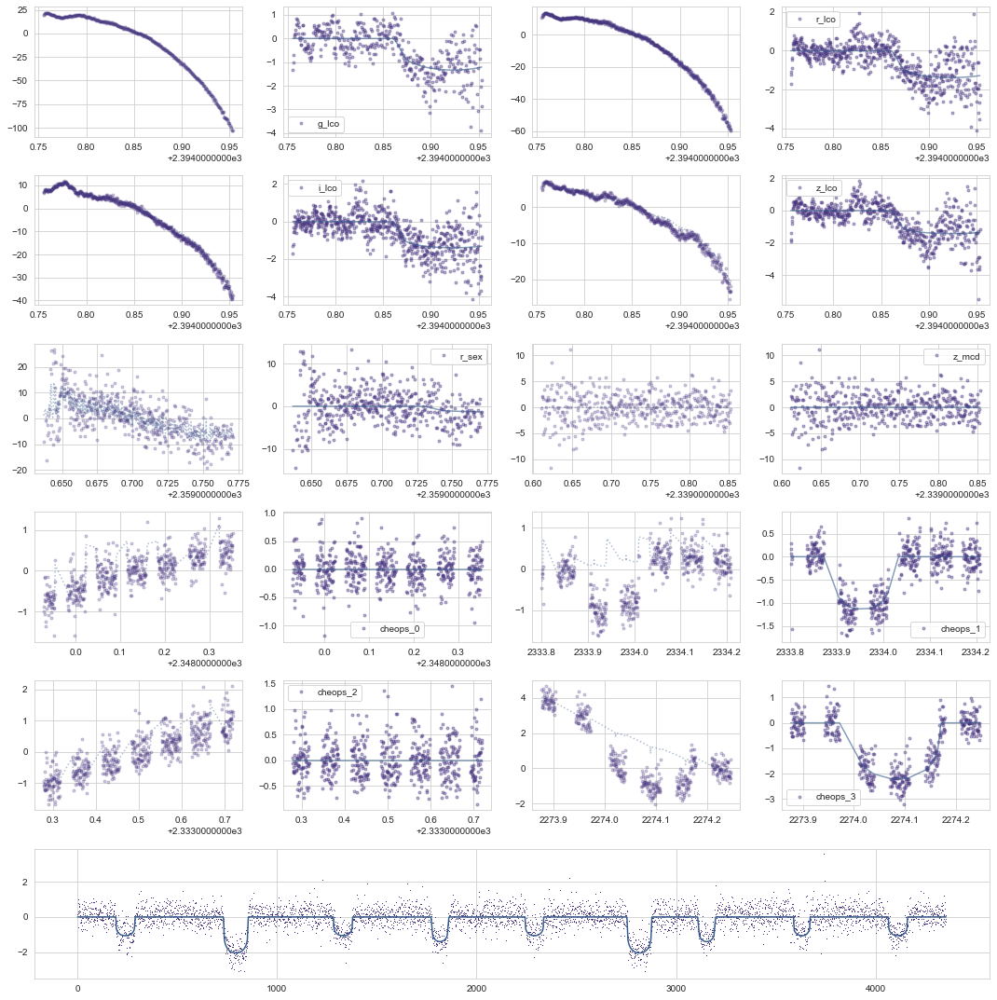

In [36]:
plt.figure(figsize=(15,15))

for n,i in enumerate(decor_scopes):
    plt.subplot(int(np.ceil(len(decor_scopes)/2)+1),4,(2*n)+1)
    plt.plot(alldata[i]['time'],alldata[i]['flux'],'.',alpha=0.25)
    plt.plot(alldata[i]['time'],comb_soln["flux_cor_"+i],':',alpha=0.4)
    #+np.sum(comb_soln["planets_x_"+i],axis=1)
    
    plt.subplot(int(np.ceil(len(decor_scopes)/2)+1),4,(2*n)+2)
    plt.plot(alldata[i]['time'],alldata[i]['flux']-comb_soln["flux_cor_"+i],'.',alpha=0.4,label=i)
    trans_mod=np.zeros(len(alldata[i]['time'])) if len(comb_soln["planets_x_"+i])==1 else comb_soln["planets_x_"+i]
    plt.plot(alldata[i]['time'],trans_mod,'-',alpha=0.6)
    plt.legend()

plt.subplot(int(np.ceil(len(decor_scopes)/2)+1),1,int(np.ceil(len(decor_scopes)/2)+1))
plt.plot(alldata['tess']['flux'],',')
plt.plot(comb_soln["planets_x_tess"],'-')

'''
plt.subplot(6,2,n+2)
plt.plot(alldata['tess']['time'],alldata['tess']['flux'],',')
plt.plot(alldata['tess']['time'],comb_soln["planets_x_tess"],'-')
plt.xlim(1737,1766)

plt.subplot(6,2,n+3)
plt.plot(alldata['tess']['time'],alldata['tess']['flux'],',')
plt.plot(alldata['tess']['time'],comb_soln["planets_x_tess"],'-')
plt.xlim(1926,1956)
'''
plt.tight_layout()
plt.savefig(save_loc+"TOI2076_finalmodel_"+filename+"_init_model(logp={0:0.1f})_alldata.png".format(comb_soln['logp']))
#print(save_loc+"TOI2076_finalmodel_"+filename+"_init_model(logp={0:0.1f})_alldata.png".format(comb_soln['logp']))

In [25]:
count=0
for scope in all_scopes:
    count+=len(alldata[scope]['time'])
print(count)

9394


In [37]:
with combined_model:
    #As we have detrending which is indepdent from each other, we can vastly improve sampling speed by splitting up these as `parameter_groups` in pmx.sample
    #`regularization_steps` also, apparently, helps for big models with lots of correlation
    groups=[[logs_phot[scope],obs_means[scope]]+[combined_model['dfd'+par+'_'+scope+'_interval__'] for par in linear_decorr_dicts[scope]]+[combined_model['d2fd'+par+'2_'+scope+'_interval__'] for par in quad_decorr_dicts[scope]] for scope in decor_scopes]+[[combined_model['Teff_interval__']]]
    trace = pmx.sample(tune=12000, draws=3500, chains=8, cores=3, regularization_steps=20,
                       start=comb_soln, target_accept=0.8,
                       parameter_groups=groups)

print("creating summary")
summary_df = pm.summary(trace,var_names=[v for v in trace.varnames if '__' not in v and np.product(trace[v].shape)<3.1*len(trace['Rs'])],
                        stat_funcs={"5%": lambda x: np.percentile(x, 5),"-$1\sigma$": lambda x: np.percentile(x, 15.87),
                          "median": lambda x: np.percentile(x, 50),"+$1\sigma$": lambda x: np.percentile(x, 84.13),
                          "95%": lambda x: np.percentile(x, 95)},
                        round_to=8)
summary_df.to_csv(save_loc+"TOI2076_finalmodel_"+filename+"_results(logp={0:0.1f}).csv".format(np.nanmax(trace['logp'])))

Multiprocess sampling (8 chains in 3 jobs)
NUTS: [mean_cheops_3, mean_cheops_2, mean_cheops_1, mean_cheops_0, mean_z_mcd, mean_r_sex, mean_z_lco, mean_i_lco, mean_r_lco, mean_g_lco, d2fdnorm_time2_cheops_3, dfdbg_cheops_3, dfdsmear_cheops_3, dfdcos_phi_cheops_3, dfdnorm_time_cheops_3, d2fdnorm_time2_cheops_2, dfdbg_cheops_2, dfdcos_phi_cheops_2, dfdsin_phi_cheops_2, dfdnorm_time_cheops_2, d2fdnorm_time2_cheops_1, dfdbg_cheops_1, dfdsmear_cheops_1, dfdcos_phi_cheops_1, dfdsin_phi_cheops_1, dfdnorm_time_cheops_1, d2fdnorm_time2_cheops_0, dfdbg_cheops_0, dfdcos_phi_cheops_0, dfdnorm_time_cheops_0, dfdairmass_z_mcd, d2fdairmass2_r_sex, dfdcompcounts_r_sex, dfdairmass_r_sex, d2fdairmass2_z_lco, dfdi/z_z_lco, dfdr/i_z_lco, dfdwidth_z_lco, dfdnorm_time_z_lco, dfdairmass_z_lco, d2fdairmass2_i_lco, dfdi/z_i_lco, dfdr/i_i_lco, dfdcompcounts_i_lco, dfdwidth_i_lco, dfdnorm_time_i_lco, dfdentropy_i_lco, dfdairmass_i_lco, d2fdairmass2_r_lco, dfdr/i_r_lco, dfdg/r_r_lco, dfdwidth_r_lco, dfdnorm_time_r

Sampling 8 chains for 12_000 tune and 3_500 draw iterations (96_000 + 28_000 draws total) took 7383 seconds.
There were 36 divergences after tuning. Increase `target_accept` or reparameterize.
There were 434 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.718633115051377, but should be close to 0.8. Try to increase the number of tuning steps.
There were 88 divergences after tuning. Increase `target_accept` or reparameterize.
There were 124 divergences after tuning. Increase `target_accept` or reparameterize.
There were 170 divergences after tuning. Increase `target_accept` or reparameterize.
There were 122 divergences after tuning. Increase `target_accept` or reparameterize.
There were 23 divergences after tuning. Increase `target_accept` or reparameterize.
There were 4 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.941

creating summary


In [26]:
summary_df = pm.summary(trace,var_names=[v for v in trace.varnames if '__' not in v and np.product(trace[v].shape)<6.1*len(trace['Rs'])],
                        stat_funcs={"5%": lambda x: np.percentile(x, 5),"-$1\sigma$": lambda x: np.percentile(x, 15.87),
                          "median": lambda x: np.percentile(x, 50),"+$1\sigma$": lambda x: np.percentile(x, 84.13),
                          "95%": lambda x: np.percentile(x, 95)},
                        round_to=8)
summary_df.to_csv(save_loc+"TOI2076_finalmodel_"+filename+"_results(logp={0:0.1f}).csv".format(np.nanmax(trace['logp'])))

In [22]:
print(combined_model)

                   Teff_interval__ ~ TransformedDistribution
                   Rs_lowerbound__ ~ TransformedDistribution
                              logg ~ Normal
                   transit_times_0 ~ Normal
                   transit_times_1 ~ Normal
                   transit_times_2 ~ Normal
                            logror ~ Normal
                      b_interval__ ~ TransformedDistribution
          u_star_cheops_interval__ ~ TransformedDistribution
               u_star_g_interval__ ~ TransformedDistribution
               u_star_i_interval__ ~ TransformedDistribution
               u_star_r_interval__ ~ TransformedDistribution
            u_star_tess_interval__ ~ TransformedDistribution
               u_star_z_interval__ ~ TransformedDistribution
                   logs_phot_g_lco ~ Normal
                   logs_phot_r_lco ~ Normal
                   logs_phot_i_lco ~ Normal
                   logs_phot_z_lco ~ Normal
                   logs_phot_r_sex ~ Normal
           

In [98]:
summary_df = pm.summary(trace,var_names=[v for v in trace.varnames if '__' not in v and np.product(trace[v].shape)<3.1*len(trace['Rs'])],
                        stat_funcs={"5%": lambda x: np.percentile(x, 5),"-$1\sigma$": lambda x: np.percentile(x, 15.87),
                          "median": lambda x: np.percentile(x, 50),"+$1\sigma$": lambda x: np.percentile(x, 84.13),
                          "95%": lambda x: np.percentile(x, 95)},round_to=8)
summary_df.to_csv(save_loc+"TOI2076_finalmodel_"+filename+"_results.csv")


In [66]:
with combined_model:
    txt, bib = xo.citations.get_citations_for_model()

In [38]:
summary_df.iloc[:60]

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat,5%,-$1\sigma$,median,+$1\sigma$,95%
logg,4.573278,0.015967,4.541992e+00,4.601500,1.276130e-03,9.040400e-04,276.701648,116.317979,1.027327,4.541481,4.558878,4.575850,4.587831,4.594681
transit_times_1[0],1748.694076,0.000802,1.748693e+03,1748.695635,1.249000e-05,8.920000e-06,4015.082929,2179.462865,1.002041,1748.692764,1748.693292,1748.694076,1748.694866,1748.695397
transit_times_1[1],1937.822021,0.000810,1.937821e+03,1937.823559,1.492000e-05,1.055000e-05,3343.049615,3118.031874,1.003223,1937.820701,1937.821213,1937.822014,1937.822820,1937.823361
transit_times_1[2],2274.083965,0.000795,2.274082e+03,2274.085489,1.160000e-05,8.520000e-06,4453.665768,4858.569728,1.002198,2274.082643,2274.083169,2274.083976,2274.084752,2274.085274
logror[0],-3.507057,0.011686,-3.528783e+00,-3.484583,3.209000e-04,2.269600e-04,1368.229072,774.198692,1.009426,-3.526003,-3.518754,-3.507170,-3.495491,-3.487402
logror[1],-3.178952,0.009503,-3.197486e+00,-3.161753,2.484900e-04,1.757400e-04,1424.021364,1282.948502,1.007634,-3.194745,-3.188572,-3.178759,-3.169507,-3.163619
logror[2],-3.257472,0.017912,-3.290469e+00,-3.223630,3.754500e-04,2.655200e-04,2286.053325,2964.285066,1.004184,-3.286725,-3.275345,-3.257591,-3.239519,-3.228008
logs_phot_g_lco,-3.555228,1.102084,-5.651799e+00,-1.839532,1.480442e-02,1.046886e-02,5202.094654,9098.559474,1.001131,-5.703221,-4.580978,-3.341953,-2.519656,-2.168194
logs_phot_r_lco,-3.870468,1.147383,-6.023659e+00,-2.093015,1.768200e-02,1.250393e-02,4207.163984,8309.812139,1.001650,-6.045372,-4.984378,-3.647845,-2.791347,-2.416441
logs_phot_i_lco,-3.866305,1.164369,-6.184196e+00,-2.159775,1.516641e-02,1.080687e-02,6628.971590,6726.754204,1.002159,-6.133523,-4.949086,-3.645081,-2.780398,-2.413234


In [71]:
print(txt)

This research made use of \textsf{exoplanet} \citep{exoplanet:joss,
exoplanet:zenodo} and its dependencies \citep{exoplanet:agol20,
exoplanet:arviz, exoplanet:astropy13, exoplanet:astropy18, exoplanet:luger18,
exoplanet:pymc3, exoplanet:theano}.


In [70]:
print(bib)


@article{exoplanet:joss,
       author = {{Foreman-Mackey}, Daniel and {Luger}, Rodrigo and {Agol}, Eric
                and {Barclay}, Thomas and {Bouma}, Luke G. and {Brandt},
                Timothy D. and {Czekala}, Ian and {David}, Trevor J. and
                {Dong}, Jiayin and {Gilbert}, Emily A. and {Gordon}, Tyler A.
                and {Hedges}, Christina and {Hey}, Daniel R. and {Morris},
                Brett M. and {Price-Whelan}, Adrian M. and {Savel}, Arjun B.},
        title = "{exoplanet: Gradient-based probabilistic inference for
                  exoplanet data \& other astronomical time series}",
      journal = {arXiv e-prints},
         year = 2021,
        month = may,
          eid = {arXiv:2105.01994},
        pages = {arXiv:2105.01994},
archivePrefix = {arXiv},
       eprint = {2105.01994},
 primaryClass = {astro-ph.IM},
       adsurl = {https://ui.adsabs.harvard.edu/abs/2021arXiv210501994F},
      adsnote = {Provided by the SAO/NASA Astrophysics Data System

In [42]:
linear_decorr_dicts.keys()

dict_keys(['g_lco', 'r_lco', 'i_lco', 'z_lco', 'r_sex', 'cheops_1', 'cheops_3'])

In [48]:
max_bytes = 2**31 - 1

## write
bytes_out = pickle.dumps(trace)
for n,idx in enumerate(range(0, len(bytes_out), max_bytes)):
    with gzip.open(save_loc+"TOI2076_finalmodel_"+filename+"_trace"+"_p"+str(n)+".pkl.gz", 'wb') as f_out:
        f_out.write(bytes_out[idx:idx+max_bytes])
    print(save_loc+"TOI2076_finalmodel_"+filename+"_trace"+"_p"+str(n)+".pkl.gz")


/Volumes/LUVOIR/Cheops_data/TOI2076/CombModelOutputs/TOI2076_finalmodel_P35_circ_ncbaenwgr_na_nogp_nocontam_fixld_looserlds_pargroups_allscopes_20211125_trace_p0.pkl.gz
/Volumes/LUVOIR/Cheops_data/TOI2076/CombModelOutputs/TOI2076_finalmodel_P35_circ_ncbaenwgr_na_nogp_nocontam_fixld_looserlds_pargroups_allscopes_20211125_trace_p1.pkl.gz
/Volumes/LUVOIR/Cheops_data/TOI2076/CombModelOutputs/TOI2076_finalmodel_P35_circ_ncbaenwgr_na_nogp_nocontam_fixld_looserlds_pargroups_allscopes_20211125_trace_p2.pkl.gz


In [31]:
trace['transit_times_2'].shape

(28000, 3)

In [22]:
with combined_model:
    trace = pmx.sample(tune=40000, draws=6000, chains=4, trace=trace, target_accept=0.96)

print("creating summary")
summary_df = pm.summary(trace,var_names=[v for v in trace.varnames if '__' not in v and np.product(trace[v].shape)<3.1*len(trace['Rs'])],round_to=5)
summary_df.to_csv(save_loc+"TOI2076_finalmodel_"+filename+"_results2(logp={0:0.1f}).csv".format(np.nanmax(trace['logp'])))

Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mean_cheops_3, mean_cheops_2, mean_cheops_1, mean_cheops_0, mean_z_mcd, mean_z_lco, mean_i_lco, mean_r_lco, mean_g_lco, mean_r_sex, d2fdnorm_time2_cheops_3, dfdbg_cheops_3, dfdsmear_cheops_3, dfdcos_phi_cheops_3, dfdnorm_time_cheops_3, d2fdnorm_time2_cheops_2, dfdbg_cheops_2, dfdcos_phi_cheops_2, dfdsin_phi_cheops_2, dfdnorm_time_cheops_2, d2fdnorm_time2_cheops_1, dfdbg_cheops_1, dfdsmear_cheops_1, dfdcos_phi_cheops_1, dfdsin_phi_cheops_1, dfdnorm_time_cheops_1, d2fdnorm_time2_cheops_0, dfdbg_cheops_0, dfdcos_phi_cheops_0, dfdnorm_time_cheops_0, dfdairmass_z_mcd, d2fdairmass2_z_lco, dfdi/z_z_lco, dfdr/i_z_lco, dfdwidth_z_lco, dfdnorm_time_z_lco, dfdairmass_z_lco, d2fdairmass2_i_lco, dfdi/z_i_lco, dfdr/i_i_lco, dfdcompcounts_i_lco, dfdwidth_i_lco, dfdnorm_time_i_lco, dfdentropy_i_lco, dfdairmass_i_lco, d2fdairmass2_r_lco, dfdr/i_r_lco, dfdg/r_r_lco, dfdwidth_r_lco, dfdnorm_time_r_lco, dfdairmass_r_lco, d2fdairmass2_g_lco, dfdr/i_g_lco, d

Sampling 4 chains for 42_500 tune and 10_000 draw iterations (170_000 + 40_000 draws total) took 4052 seconds.
The acceptance probability does not match the target. It is 0.8705168214806233, but should be close to 0.96. Try to increase the number of tuning steps.
The acceptance probability does not match the target. It is 0.01644251088393435, but should be close to 0.96. Try to increase the number of tuning steps.
The rhat statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


creating summary


In [40]:
max_bytes = 2**31 - 1

## write
bytes_out = pickle.dumps(trace)
for n,idx in enumerate(range(0, len(bytes_out), max_bytes)):
    with gzip.open(save_loc+"TOI2076_finalmodel_"+filename+"_trace2(logp={0:0.1f})".format(np.nanmax(trace['logp']))+"_p"+str(n)+".pkl.gz", 'wb') as f_out:
        f_out.write(bytes_out[idx:idx+max_bytes])


In [75]:
filename

'P35_circ_ncbaenwgr_na_nogp_nocontam_fixld_add_parameter_groups_pmxsample_20211125'

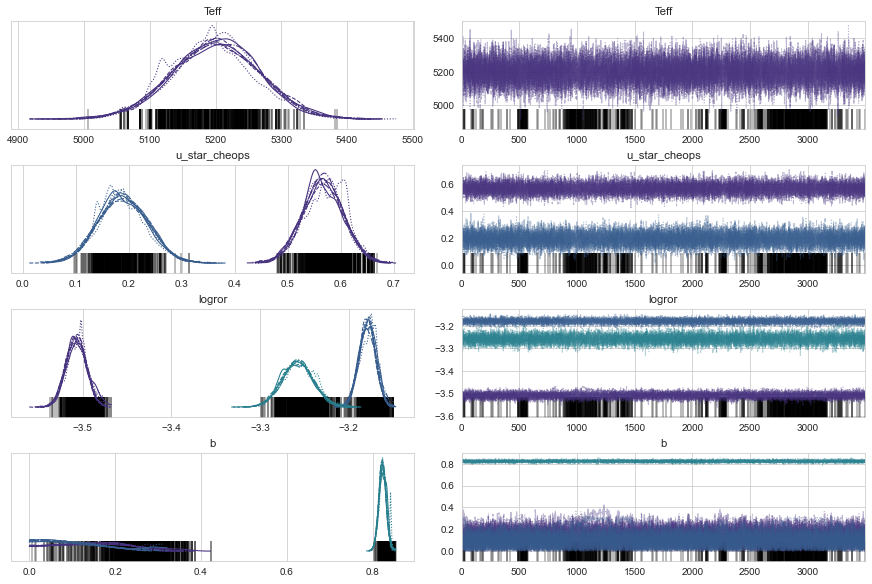

In [39]:
import arviz as az
_ = az.plot_trace(trace, var_names=["Teff", "u_star_cheops", "logror", "b"])


In [74]:
filename

'P35_circ_ncbaenwgr_na_nogp_nocontam_fixld_add_parameter_groups_pmxsample_20211125'

In [ ]:
## read
bytes_in = bytearray(0)
input_size = os.path.getsize(file_path)
with gzip.open(file_path, 'rb') as f_in:
    for _ in range(0, input_size, max_bytes):
        bytes_in += f_in.read(max_bytes)
data2 = pickle.loads(bytes_in)


In [64]:
np.nanstd(trace['logror'],axis=0)

array([0.00240677, 0.00306245, 0.00227025])

In [57]:
trace.varnames

['Teff_lowerbound__',
 'Rs_lowerbound__',
 'logg',
 'transit_times_0',
 'transit_times_1',
 'transit_times_2',
 'logror',
 'b_impact__',
 'period',
 'u_star_g_interval__',
 'u_star_r_interval__',
 'u_star_i_interval__',
 'u_star_z_interval__',
 'u_star_cheops_interval__',
 'u_star_tess_interval__',
 'logs_phot_r_sex',
 'logs_phot_g_lco',
 'logs_phot_r_lco',
 'logs_phot_i_lco',
 'logs_phot_z_lco',
 'logs_phot_z_mcd',
 'logs_phot_cheops_0',
 'logs_phot_cheops_1',
 'logs_phot_cheops_2',
 'logs_phot_cheops_3',
 'logs_phot_tess',
 'dfdairmass_r_sex_interval__',
 'dfdcompcounts_r_sex_interval__',
 'd2fdairmass2_r_sex_interval__',
 'dfdairmass_g_lco_interval__',
 'dfdentropy_g_lco_interval__',
 'dfdnorm_time_g_lco_interval__',
 'dfdwidth_g_lco_interval__',
 'dfdg/r_g_lco_interval__',
 'dfdr/i_g_lco_interval__',
 'd2fdairmass2_g_lco_interval__',
 'dfdairmass_r_lco_interval__',
 'dfdnorm_time_r_lco_interval__',
 'dfdwidth_r_lco_interval__',
 'dfdg/r_r_lco_interval__',
 'dfdr/i_r_lco_interval__'

In [64]:
save_loc+"TOI2076_finalmodel_"+filename+"_trace(logp={0:0.1f}).pkl".format(np.nanmax(trace['logp']))

'/Volumes/LUVOIR/Cheops_data/TOI2076/CombModelOutputs/TOI2076_finalmodel_P35_circ_ncbaenwgr_na_nogp_nocontam_fixld_testing_entropy_correlations2_20211117_trace(logp=-2511.3).pkl'

In [61]:
summary_df = pm.summary(trace,var_names=[v for v in trace.varnames if '__' not in v and np.product(trace[v].shape)<3.1*len(trace['Rs'])],round_to=5)
summary_df.to_csv(save_loc+"TOI2076_finalmodel_"+filename+"_results(logp={0:0.1f}).csv".format(np.nanmax(trace['logp'])))

WARNING (theano.tensor.opt): Cannot construct a scalar test value from a test value with no size: Elemwise{true_div,no_inplace}.0
WARNING (theano.tensor.opt): Cannot construct a scalar test value from a test value with no size: Elemwise{sin,no_inplace}.0
WARNING (theano.tensor.opt): Cannot construct a scalar test value from a test value with no size: Join.0
WARNING (theano.tensor.opt): Cannot construct a scalar test value from a test value with no size: InplaceDimShuffle{0,x}.0
WARNING (theano.tensor.opt): Cannot construct a scalar test value from a test value with no size: Elemwise{true_div,no_inplace}.0
WARNING (theano.tensor.opt): Cannot construct a scalar test value from a test value with no size: Elemwise{sin,no_inplace}.0
WARNING (theano.tensor.opt): Cannot construct a scalar test value from a test value with no size: Join.0
WARNING (theano.tensor.opt): Cannot construct a scalar test value from a test value with no size: InplaceDimShuffle{0,x}.0
WARNING (theano.tensor.opt): Canno

WARNING (theano.tensor.opt): Cannot construct a scalar test value from a test value with no size: Elemwise{true_div,no_inplace}.0
WARNING (theano.tensor.opt): Cannot construct a scalar test value from a test value with no size: Elemwise{sin,no_inplace}.0
WARNING (theano.tensor.opt): Cannot construct a scalar test value from a test value with no size: Join.0
WARNING (theano.tensor.opt): Cannot construct a scalar test value from a test value with no size: InplaceDimShuffle{0,x}.0
WARNING (theano.tensor.opt): Cannot construct a scalar test value from a test value with no size: Elemwise{true_div,no_inplace}.0
WARNING (theano.tensor.opt): Cannot construct a scalar test value from a test value with no size: Elemwise{sin,no_inplace}.0
WARNING (theano.tensor.opt): Cannot construct a scalar test value from a test value with no size: Join.0
WARNING (theano.tensor.opt): Cannot construct a scalar test value from a test value with no size: InplaceDimShuffle{0,x}.0
WARNING (theano.tensor.opt): Canno

In [55]:
#trace=pickle.load(open("TOI2076_finalmodel_P35_circ_nscsdbanwc_na_nogp_nocontam_trace(logp=-3704.3).pkl",'rb'))

In [34]:
trace["planets_x_"+i]

array([[0.],
       [0.],
       [0.],
       ...,
       [0.],
       [0.],
       [0.]])

g_lco -1.5220507707043307
r_lco -1.5842464533479816
i_lco -1.59264080963617
z_lco -1.6392581607652668
r_sex -1.5643705780316042
z_mcd 0.0
cheops_0 0.0
cheops_1 -1.2279658271056038
cheops_2 0.0
cheops_3 -2.414691143499348


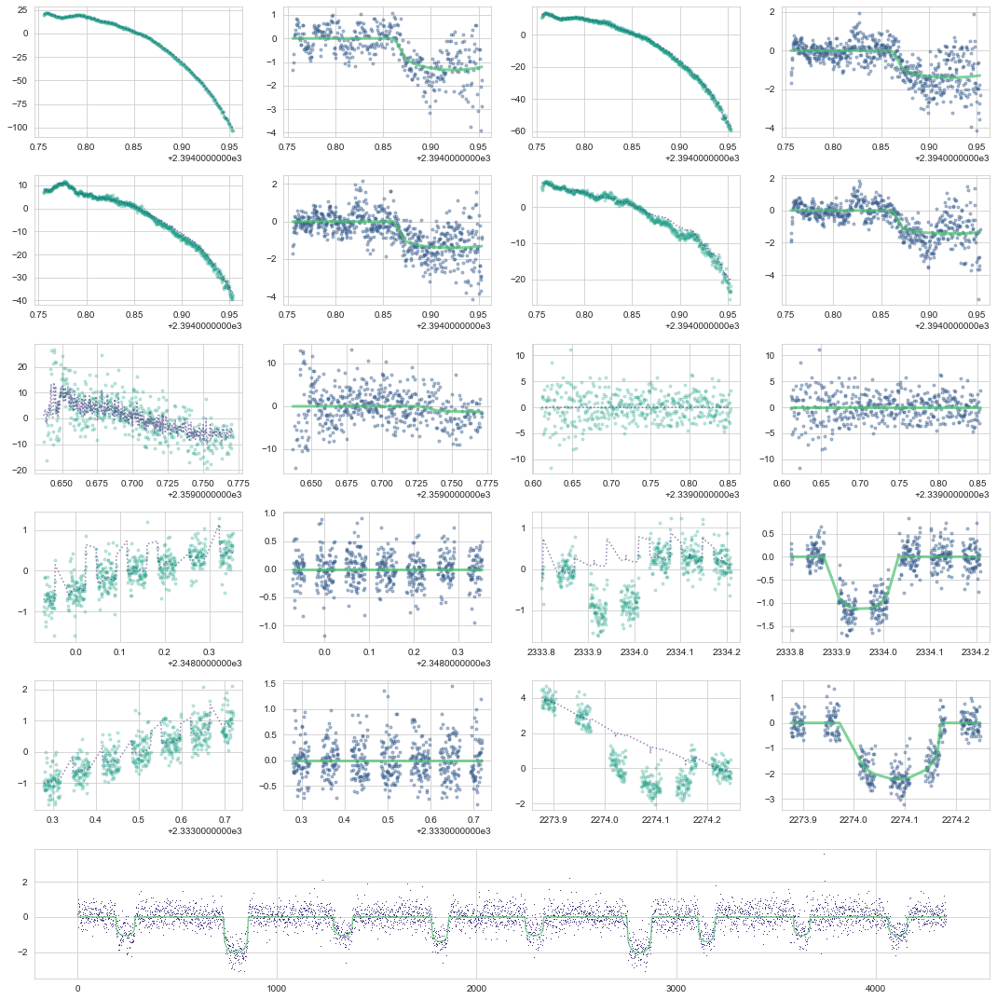

In [41]:
plt.figure(figsize=(15,15))

for n,i in enumerate(decor_scopes):
    plt.subplot(6,4,(2*n)+1)
    plt.plot(alldata[i]['time'],alldata[i]['flux'],'.',alpha=0.25,color='C3')
    plt.plot(alldata[i]['time'],np.nanmedian(trace["flux_cor_"+i],axis=0),':',alpha=0.6,color='C6')
    plt.subplot(6,4,(2*n)+2)
    plt.plot(alldata[i]['time'],alldata[i]['flux']-np.nanmedian(trace["flux_cor_"+i],axis=0),'.',alpha=0.4,color='C1')
    print(i,np.nanmin(trace["planets_x_"+i]))
    if np.nanmin(trace["planets_x_"+i])<0.0:
        plt.plot(alldata[i]['time'],np.nanmedian(trace["planets_x_"+i],axis=0),'-',alpha=0.7,color='C4',linewidth=3)
    else:
        plt.plot(alldata[i]['time'],np.zeros(len(alldata[i]['time'])),'-',alpha=0.7,color='C4',linewidth=3)
i='tess'
plt.subplot(6,1,6)
plt.plot(alldata['tess']['flux'],',')
plt.plot(np.nanmedian(trace["planets_x_"+i],axis=0),'-',alpha=0.7,color='C4')
plt.tight_layout()
plt.savefig(save_loc+"TOI2076_finalmodel_"+filename+"_trace_alldata.png")

In [42]:
for d in summary_df.index:
    if (d[:3]=='d2f' or d[:3]=='dfd') and abs(summary_df.loc[d,'mean'])<summary_df.loc[d,'sd']:
        print(d,summary_df.loc[d,'mean'],summary_df.loc[d,'sd'])

dfdentropy_g_lco 0.10923255 0.2367791
dfdairmass_z_mcd -0.0095138 1.01373826
dfdcos_phi_cheops_1 -0.01301736 0.01358128
dfdcos_phi_cheops_2 0.00584893 0.01722421
d2fdnorm_time2_cheops_2 -0.01165636 0.01739729
dfdbg_cheops_3 0.0145417 0.02181645


12.073097009379126 ± 2.3550897264613013
7.112677958612039 ± 1.9365078798844477
-6.516512840444193 ± 2.627811133900832
-10.1585083599457 ± 1.9677024219949093
-9.445152500939002 ± 2.173059087723959
11.872650083096232 ± 4.437791500949243
-7.438971716346714 ± 0.6025303408714535
10.444047168384714 ± 1.0887233672488943
-7.411566220362147 ± 1.527856865292415
-1.3719039704301395 ± 1.8558417767984792
-1.3543633479639539 ± 2.3316323588580414
-2.7353096006117994 ± 32.692110355035396
-16.758788802908384 ± 3.187326438947639


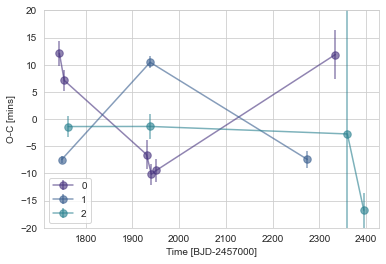

In [43]:
ttvs={}
for npl,pl in enumerate(info):
    if npl!=2:
        new_p=(np.nanmedian(trace['transit_times_'+str(pl)][:,-1])-np.nanmedian(trace['transit_times_'+str(pl)][:,0]))/np.max(init_transit_inds[pl])
    else:
        new_p=(np.nanmedian(trace['transit_times_'+str(pl)][:,1])-np.nanmedian(trace['transit_times_'+str(pl)][:,0]))/init_transit_inds[pl][1]
    out=np.nanpercentile(1440*(trace['t0'][:,npl]+new_p*init_transit_inds[pl][:,None] - trace['transit_times_'+str(pl)].T),[16,50,84],axis=1)
    ttvs[pl]=[]
    for i in range(len(out[0])):
        ttvs[pl]+=[[out[1,i],0.5*(out[2,i]-out[0,i])]]
        print(out[1,i],"±",0.5*(out[2,i]-out[0,i]))

    plt.errorbar(np.nanmedian(trace['t0'][:,pl])+new_p*init_transit_inds[pl],
                 np.vstack((ttvs[pl]))[:,0],
                 yerr=np.vstack((ttvs[pl]))[:,1],fmt='.-',label=str(pl),alpha=0.6,markersize=15)
plt.ylim(-20,20)
plt.ylabel("O-C [mins]")
plt.xlabel("Time [BJD-2457000]")
plt.legend()
plt.savefig("TOI2076_finalmodel_"+filename+"_trace_TTVs.png")

### Figures and Tables

Figures:
* Photometry from all 6 filters/telescopes detrended for each P=25 and P=35d models
* Photometry from all 4 Cheops visits, including detrending
* TESS photmetry phase-folded on each planet, with offsets for Cheops & ground-based data
* TTVs figure can come when we derive a good TTV model from e.g. TTVfast
* 

Tables:
* Variable, Prior and posterior table for all parameters
* All transit times and uncertainties
* Derived planetary properties for each planet


#### Figure - Ground-based data:

#### Figure - Cheops data:

#### Figure - Phase-folding

#### Table - All Model Variables

#### Table - Transit Times

#### Table - Planetary Properties

In [12]:
with combined_model:    
    mctrace = pm.sample(20000,step=pm.Metropolis(), chains=4, start=comb_soln, progressbar=True)


Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>Metropolis: [mean_cheops_3]
>Metropolis: [mean_cheops_1]
>Metropolis: [mean_r_sex]
>Metropolis: [mean_z_lco]
>Metropolis: [mean_i_lco]
>Metropolis: [mean_r_lco]
>Metropolis: [mean_g_lco]
>Metropolis: [d2fdnorm_time2_cheops_3]
>Metropolis: [dfdbg_cheops_3]
>Metropolis: [dfdsmear_cheops_3]
>Metropolis: [dfdcos_phi_cheops_3]
>Metropolis: [dfdnorm_time_cheops_3]
>Metropolis: [d2fdnorm_time2_cheops_1]
>Metropolis: [dfdbg_cheops_1]
>Metropolis: [dfdsmear_cheops_1]
>Metropolis: [dfdcos_phi_cheops_1]
>Metropolis: [dfdsin_phi_cheops_1]
>Metropolis: [dfdnorm_time_cheops_1]
>Metropolis: [d2fdairmass2_r_sex]
>Metropolis: [dfdcompcounts_r_sex]
>Metropolis: [dfdairmass_r_sex]
>Metropolis: [d2fdairmass2_z_lco]
>Metropolis: [dfdi/z_z_lco]
>Metropolis: [dfdr/i_z_lco]
>Metropolis: [dfdwidth_z_lco]
>Metropolis: [dfdnorm_time_z_lco]
>Metropolis: [dfdairmass_z_lco]
>Metropolis: [d2fdairmass2_i_lco]
>Metropolis: [dfdi/z_i_lco]
>Metropolis: [dfdr/i_i_l

KeyboardInterrupt: 

In [ ]:
#35:-2509.3 -> 88:-2622.2
#(with looser LDs)
#New 35:-2523.8, new 25: -2629.4, new 88: -2927.6

In [13]:
print(save_loc+"TOI2076_finalmodel_"+filename+"_init_model(logp={0:0.1f})_alldata.png".format(comb_soln['logp']))

/Volumes/LUVOIR/Cheops_data/TOI2076/CombModelOutputs/TOI2076_finalmodel_P35_circ_ncbaenwgr_na_nogp_nocontam_fixld_cutting_flat_lcs_20211124_init_model(logp=-467.4)_alldata.png


In [ ]:
from fastprogress.fastprogress import force_console_behavior
master_bar, progress_bar = force_console_behavior()
with combined_model:
    smctrace2 = pm.sample_smc(draws=1500)

Initializing SMC sampler...
Sampling 6 chains in 6 jobs


In [ ]:
summary_df2=pm.summary(smctrace2,
           var_names=[v for v in smctrace2.varnames if '__' not in v and np.product(smctrace2[v].shape)<3.1*len(smctrace2['Rs'])],
           round_to=5)
summary_df2.to_csv(save_loc+"TOI2076_finalmodel_"+filename+"_tracesummary2.png")

In [ ]:
max_bytes = 2**31 - 1

## write
bytes_out = pickle.dumps(smctrace2)
for n,idx in enumerate(range(0, len(bytes_out), max_bytes)):
    with gzip.open(save_loc+"TOI2076_finalmodel_"+filename+"_trace2"+"_p"+str(n)+".pkl.gz", 'wb') as f_out:
        f_out.write(bytes_out[idx:idx+max_bytes])


In [ ]:
with combined_model:
    smctrace3 = pm.sample_smc(draws=1500)

In [ ]:
summary_df3=pm.summary(smctrace3,
           var_names=[v for v in smctrace3.varnames if '__' not in v and np.product(smctrace3[v].shape)<3.1*len(smctrace3['Rs'])],
           round_to=5)
summary_df3.to_csv(save_loc+"TOI2076_finalmodel_"+filename+"_tracesummary3.png")

In [ ]:
bytes_out = pickle.dumps(smctrace3)
for n,idx in enumerate(range(0, len(bytes_out), max_bytes)):
    with gzip.open(save_loc+"TOI2076_finalmodel_"+filename+"_trace3"+"_p"+str(n)+".pkl.gz", 'wb') as f_out:
        f_out.write(bytes_out[idx:idx+max_bytes])

In [17]:
summary_df=pm.summary(smctrace,
           var_names=[v for v in smctrace.varnames if '__' not in v and np.product(smctrace[v].shape)<3.1*len(smctrace['Rs'])],
           round_to=5)
summary_df.to_csv(save_loc+"TOI2076_finalmodel_"+filename+"_tracesummary.png")
summary_df.iloc[:60]

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
logg,4.44292,0.09160,4.28397,4.60396,0.03668,0.02726,6.71094,24.50772,3.37206
transit_times_1[0],1748.69422,0.00185,1748.69073,1748.69782,0.00020,0.00014,89.02540,1754.66816,1.04866
transit_times_1[1],1937.82147,0.00210,1937.81748,1937.82538,0.00043,0.00031,26.15908,37.05621,1.15712
transit_times_1[2],2274.08510,0.00378,2274.07628,2274.09057,0.00129,0.00094,12.14482,28.08168,1.43555
logror[0],-4.10848,0.05494,-4.16918,-3.98268,0.02159,0.01601,8.12559,25.93338,2.04713
logror[1],-3.74864,0.04855,-3.81300,-3.68450,0.01929,0.01432,8.38188,37.14472,1.93815
logror[2],-4.04929,0.29767,-4.58142,-3.69911,0.12009,0.08931,6.64355,24.75874,3.55620
period[0],10.35494,0.00112,10.35275,10.35687,0.00002,0.00001,2840.09540,2760.69438,1.00426
period[1],21.01519,0.00252,21.01071,21.01979,0.00062,0.00045,16.56630,69.13817,1.27513
period[2],35.12531,0.00336,35.11930,35.13183,0.00100,0.00072,11.94162,29.76934,1.44869


In [19]:
smctrace['Rs'].shape

(3000,)

In [38]:
df.to_csv(save_loc+"TOI2076_finalmodel_"+filename+"_results.csv")

In [15]:
pmx.sample?

In [47]:
[linear_decorr_dicts[scope] for scope in decor_scopes]

[{'airmass': dfdairmass_g_lco ~ Bound-Normal,
  'entropy': dfdentropy_g_lco ~ Bound-Normal,
  'norm_time': dfdnorm_time_g_lco ~ Bound-Normal,
  'width': dfdwidth_g_lco ~ Bound-Normal,
  'g/r': dfdg/r_g_lco ~ Bound-Normal,
  'r/i': dfdr/i_g_lco ~ Bound-Normal},
 {'airmass': dfdairmass_r_lco ~ Bound-Normal,
  'norm_time': dfdnorm_time_r_lco ~ Bound-Normal,
  'width': dfdwidth_r_lco ~ Bound-Normal,
  'g/r': dfdg/r_r_lco ~ Bound-Normal,
  'r/i': dfdr/i_r_lco ~ Bound-Normal},
 {'airmass': dfdairmass_i_lco ~ Bound-Normal,
  'entropy': dfdentropy_i_lco ~ Bound-Normal,
  'norm_time': dfdnorm_time_i_lco ~ Bound-Normal,
  'width': dfdwidth_i_lco ~ Bound-Normal,
  'compcounts': dfdcompcounts_i_lco ~ Bound-Normal,
  'r/i': dfdr/i_i_lco ~ Bound-Normal,
  'i/z': dfdi/z_i_lco ~ Bound-Normal},
 {'airmass': dfdairmass_z_lco ~ Bound-Normal,
  'norm_time': dfdnorm_time_z_lco ~ Bound-Normal,
  'width': dfdwidth_z_lco ~ Bound-Normal,
  'r/i': dfdr/i_z_lco ~ Bound-Normal,
  'i/z': dfdi/z_z_lco ~ Bound-Norma

In [65]:
for var in combined_model.vars:
    if "TransformedDistribution" not in var and "__" not in var and "Deterministic" not in var:
        print(var)

TypeError: TensorType does not support iteration. Maybe you are using builtins.sum instead of theano.tensor.sum? (Maybe .max?)

In [67]:
alldata['lds']

{'g': array([[0.71873215, 0.09681329],
        [0.74722436, 0.0732171 ],
        [0.7314404 , 0.08654292],
        ...,
        [0.74891038, 0.07204126],
        [0.73616845, 0.08259538],
        [0.72655067, 0.09030101]]),
 'r': array([[0.52047335, 0.19825929],
        [0.5191884 , 0.19733932],
        [0.52486562, 0.19530594],
        ...,
        [0.48265122, 0.22371647],
        [0.52540858, 0.19421955],
        [0.4768807 , 0.2256643 ]]),
 'i': array([[0.40776336, 0.21730064],
        [0.41135501, 0.20963908],
        [0.38470078, 0.23147808],
        ...,
        [0.38828231, 0.22671197],
        [0.4019785 , 0.22211456],
        [0.38904421, 0.22482235]]),
 'z': array([[0.24576159, 0.3095873 ],
        [0.21880381, 0.34306058],
        [0.21005449, 0.35305419],
        ...,
        [0.2308289 , 0.32914018],
        [0.214779  , 0.34818464],
        [0.24114275, 0.31848297]]),
 'cheops': array([[0.54144158, 0.16696218],
        [0.54196474, 0.16655367],
        [0.52818801, 0.176

In [44]:
def vals_to_latex(vals):
    #Function to turn -1,0, and +1 sigma values into round latex strings for a table
    try:
        roundval=int(np.min([-1*np.floor(np.log10(abs(vals[1]-vals[0])))+1,-1*np.floor(np.log10(abs(vals[2]-vals[1])))+1]))
        errs=[vals[2]-vals[1],vals[1]-vals[0]]
        if np.round(errs[0],roundval-1)==np.round(errs[1],roundval-1):
            #Errors effectively the same...
            if roundval<0:
                return " $ "+str(int(np.round(vals[1],roundval)))+" \pm "+str(int(np.round(np.average(errs),roundval)))+" $ "
            else:
                return " $ "+str(np.round(vals[1],roundval))+" \pm "+str(np.round(np.average(errs),roundval))+" $ "
        else:
            if roundval<0:
                return " $ "+str(int(np.round(vals[1],roundval)))+"^{+"+str(int(np.round(errs[0],roundval)))+"}_{-"+str(int(np.round(errs[1],roundval)))+"} $ "
            else:
                return " $ "+str(np.round(vals[1],roundval))+"^{+"+str(np.round(errs[0],roundval))+"}_{-"+str(np.round(errs[1],roundval))+"} $ "
    except:
        return " - "

In [45]:
import numpy as np

In [58]:
plname_dic={0:'b',1:'c',2:'d'}

name_dic={'Teff':'Stellar temperature, \\teff{}  [K] ',
 'Rs':'Stellar radius, $R_s$ [$R_\\oplus$]',
 'logg':'log stellar surface gravity, \\logg{}  [cgs]'}
for npl in range(3):
    for nt in range(trace['transit_times_'+str(npl)].shape[1]):
        name_dic.update({'transit_times_'+str(npl)+'_'+str(nt):'Transit time, $t_{'+plname_dic[npl]+','+str(nt)+'}$ [BJD-2457000]'})
    name_dic.update({'b_'+str(npl):'Impact parameter, $b_{'+str(npl)+'}$ '})

transitnames={'logror':'Log radius ratio, $\log{R_{p,q1}/R_s}$ ',
              'b_interval__':'Impact parameter, $b_{q1}$ ',
              'period':'Orbital period, $P_{q1}$ [d] '}
for name in transitnames:
    for npl in range(3):
        name_dic.update({name+'_'+str(npl):transitnames[name].replace('q1',plname_dic[npl])})

for filt in ['g','r','i','z','cheops','tess']:
    for n in range(2):
        name_dic.update({'u_star_'+filt+'_'+str(n):'Quadratic LD, $u_{{\\rm '+filt+'},'+str(n)+'} $ '})

decornames={'airmass':'Normalised airmass trend, $df/d({\\rm airmass})_N$ ',
            'compcounts':'Normalised companion Flux trend, $df/dF_{{\\rm comps},N}$ ',
            'entropy':'Normalised aperture entropy trend, $df/d({\\rm entropy})_N$ ',
            'norm_time':'Normalised time trend, $df/d({\\rm time})_N$ ',
            'width':'Normalised aperture width trend, $df/d({\\rm width})_N$ ',
            'g/r':'Normalised g/r colour trend, $df/d({\\rm g/r})_N$ ',
            'r/i':'Normalised r/i colour trend, $df/d({\\rm r/i})_N$ ',
            'i/z':'Normalised i/z colour trend, $df/d({\\rm i/z})_N$ ',
            'sin_phi':'Normalised sine of Rollangle slope, $df/d({\\sin{\\Phi}})_N$  ',
            'cos_phi':'Normalised cosine of Rollangle slope, $df/d({\\cos{\\Phi}})_N$ ',
            'bg':'Normalised background flux slope, $df/d{\\rm bg})_N$ ',
            'smear':'Normalised CCD smear slope, $df/d{\\rm smear})_N$ '}

for scope in all_scopes:
    name_dic.update({'logs_phot_'+scope:'Log photometric scatter, $\log{\\sigma_{{\\rm '+scope+'},s}/(\\rm{ppt})}$ '})

for scope in decor_scopes:
    name_dic.update({'mean_'+scope:'Mean flux, $\\mu_{{\\rm '+scope.replace('_','-')+'}}$ [ppt] '})
    for param in linear_decorr_dicts[scope]:
        name_dic.update({'dfd'+param+'_'+scope:decornames[param].replace('Normalised',scope.replace('_','-')),
                         'd2fd'+param+'2_'+scope:decornames[param].replace('Normalised',scope.replace('_','-')).replace('trend','quadratic').replace('$df','$d^2f').replace('_N$','^2_N$').replace('_{{\\rm comps},N}$','^2_{{\\rm comps},N}$')})
name_dic

{'Teff': 'Stellar temperature, \\teff{}  [K] ',
 'Rs': 'Stellar radius, $R_s$ [$R_\\oplus$]',
 'logg': 'log stellar surface gravity, \\logg{}  [cgs]',
 'transit_times_0_0': 'Transit time, $t_{b,0}$ [BJD-2457000]',
 'transit_times_0_1': 'Transit time, $t_{b,1}$ [BJD-2457000]',
 'transit_times_0_2': 'Transit time, $t_{b,2}$ [BJD-2457000]',
 'transit_times_0_3': 'Transit time, $t_{b,3}$ [BJD-2457000]',
 'transit_times_0_4': 'Transit time, $t_{b,4}$ [BJD-2457000]',
 'transit_times_0_5': 'Transit time, $t_{b,5}$ [BJD-2457000]',
 'b_0': 'Impact parameter, $b_{0}$ ',
 'transit_times_1_0': 'Transit time, $t_{c,0}$ [BJD-2457000]',
 'transit_times_1_1': 'Transit time, $t_{c,1}$ [BJD-2457000]',
 'transit_times_1_2': 'Transit time, $t_{c,2}$ [BJD-2457000]',
 'b_1': 'Impact parameter, $b_{1}$ ',
 'transit_times_2_0': 'Transit time, $t_{d,0}$ [BJD-2457000]',
 'transit_times_2_1': 'Transit time, $t_{d,1}$ [BJD-2457000]',
 'transit_times_2_2': 'Transit time, $t_{d,2}$ [BJD-2457000]',
 'transit_times_2

In [59]:
allnames=[]
table=[]
for var in combined_model.free_RVs:
    distribution = str(var.distribution).split("~")[1].strip()
    if len(trace[var.name].shape)==1:
        posterior=vals_to_latex(np.percentile(trace[var.name.replace('_interval__','')],[15.87,50,84.13]))
    else:
        posterior=[vals_to_latex(np.percentile(trace[var.name.replace('_interval__','')][:,n],[15.87,50,84.13])) for n in range(trace[var.name].shape[1])]
    if distribution=='Normal':
        if var.distribution.mu.value.shape==():
            allnames+=[var.name]
            table+=[name_dic[allnames[-1]] + " & $\\mathcal{{N}}(\\mu={0:.4g},\\sigma={1:.4g}) $ & {2} \\\\\n".format(var.distribution.mu.value,var.distribution.sigma.value,posterior)]
        else:
            sigmas=np.tile(var.distribution.sigma.value,len(var.distribution.mu.value)) if var.distribution.sigma.value.shape==() else var.distribution.sigma.value
            for i in range(len(var.distribution.mu.value)):
                allnames+=[var.name+"_"+str(i)]
                table+=[name_dic[allnames[-1]] + \
                      " & $\\mathcal{{N}}(\\mu={0:.6g},\\sigma={1:.6g})$ & {2} \\\\\n".format(var.distribution.mu.value[i],sigmas[i],posterior[i])]
    elif 'u_star' in var.name:
        for n in range(2):
            filttype=var.name.split('_')[2]
            allnames+=[var.name.replace('interval__','')+str(n)]
            table+=[name_dic[allnames[-1]]+" & $\\mathcal{{N}}_{{\\mathcal{{U}}}}(a={0:0.4f},b={1:0.4f},\\mu={2:0.4f},\\sigma={3:0.4f})$ & {4} \\\\\n".format(*[np.nanpercentile(alldata['lds'][filttype][:,n],1),
                                                                                           np.nanpercentile(alldata['lds'][filttype][:,n],99),
                                                                                           np.clip(np.nanmedian(alldata['lds'][filttype][:,n],axis=0),0,1),
                                                                                           np.clip(np.nanstd(alldata['lds'][filttype][:,n],axis=0),0.05,1.0),posterior[n]])]
    elif (var.name[:3]=='dfd' or var.name[:3]=='d2f') and 'airmass' in var.name and np.any([scope in var.name for scope in ['g_lco','r_lco','i_lco','z_lco','r_sex']]):
        allnames+=[var.name.replace('_interval__','')]
        table+=[name_dic[allnames[-1]]+" & $ \\mathcal{{U}}(a=-35,b=10) $ & "+posterior+" \\\\\n"]
    elif var.name[:3]=='dfd' or var.name[:3]=='d2f':
        allnames+=[var.name.replace('_interval__','')]
        table+=[name_dic[allnames[-1]]+" & $\\mathcal{{N}}_{{\\mathcal{{U}}}}(a=-20,b=20,\\mu=0,\\sigma=1)$ & "+posterior+" \\\\\n"]
    elif 'b_interval__' in var.name:
        for n in range(3):
            posterior=vals_to_latex(np.percentile(trace['b'][:,n],[15.87,50,84.13]))
            allnames+=[var.name.replace('interval__','')+str(n)]
            table+=[name_dic[allnames[-1]]+" & $ \\mathcal{{U}}(a=0.0,b=1+R_{p,"+plname_dic[n]+"}/R_s)^\ddagger{}$ & "+posterior+" \\\\\n"]
    elif 'Teff' in var.name:
        allnames+=['Teff']
        table+=[name_dic[allnames[-1]]+" & $\\mathcal{{N}}_{{\\mathcal{{U}}}}(a=4000,b=6000,\\mu={0:.4g},\\sigma={1:.4g})$ & {2} \\\\\n".format(alldata['star']['teff'],alldata['star']['teff_err'],posterior)]
    elif 'Rs' in var.name:
        posterior=vals_to_latex(np.percentile(trace['Rs'],[15.87,50,84.13]))
        allnames+=['Rs']
        table+=[name_dic[allnames[-1]]+" & $\\mathcal{{N}}_{{\\mathcal{{U}}}}(a=0,\\mu={0:.4g},\\sigma={1:.4g})$ & {2} \\\\\n".format(alldata['star']['rad'],alldata['star']['rad_err'],posterior)]
    else:
        print(var.name)

with open("TOI-2076CheopsPaper/TOI2076_finalmodel_"+filename+"_trace_modeltable1.tex",'w') as f:
    f.write(''.join(table[:58]).replace('r-sex','r-SaEx').replace('cheops-','Cheops-').replace('z-mcd','z-McD'))

with open("TOI-2076CheopsPaper/TOI2076_finalmodel_"+filename+"_trace_modeltable2.tex",'w') as f:
    f.write(''.join(table[58:]).replace('r-sex','r-SaEx').replace('cheops-','Cheops-').replace('z-mcd','z-McD'))

In [54]:
for var in combined_model.free_RVs:
    if 'b_interval__' in var.name:
        print(var.name)

b_interval__


In [48]:
"TOI-2076CheopsPaper/TOI2076_finalmodel_"+filename+"_trace_modeltable2.tex"

'TOI-2076CheopsPaper/TOI2076_finalmodel_P35_circ_ncbaenwgr_na_nogp_nocontam_fixld_35d_fixed_ror_vals_20211205_trace_modeltable2.tex'

In [50]:
filename

'P35_circ_ncbaenwgr_na_nogp_nocontam_fixld_35d_fixed_ror_vals_20211205'

'z-lco airmass trend, $df/d({\\rm airmass})_N$ & --  & $ \\mathcal{{U}}(a=-35,b=10) $ & $ 0.266^{+0.044}_{-0.081} $ \\\\\n'

In [130]:
print("TOI-2076CheopsPaper/TOI2076_finalmodel_"+filename+"_trace(logp={0:0.1f})_modeltable.tex".format(np.nanmax(trace['logp'])))

TOI-2076CheopsPaper/TOI2076_finalmodel_P35_circ_ncbaenwgr_na_nogp_nocontam_fixld_testing_entropy_correlations2_20211117_trace(logp=-2511.3)_modeltable.tex


In [24]:
from IPython.display import display, Math, Latex
display(Latex("$ \\text{d2fdnorm_time2_cheops_3} \\sim \\text{Uniform}(\\mathit{lower}=-10.0,~\\mathit{upper}=10.0) $"))

<IPython.core.display.Latex object>

In [44]:
for var in combined_model.cont_vars:
    if "transformed" not in var and "Deterministic" not in var:
       for var in basic_model.free_RVs:
    print(var.__latex__())

TypeError: TensorType does not support iteration. Maybe you are using builtins.sum instead of theano.tensor.sum? (Maybe .max?)

In [19]:
np.nanmedian(trace['logp'])

-3897.51764978913

ValueError: It looks like the parameter(s) in column(s) 0, 1, 2 have no dynamic range. Please provide a `range` argument.

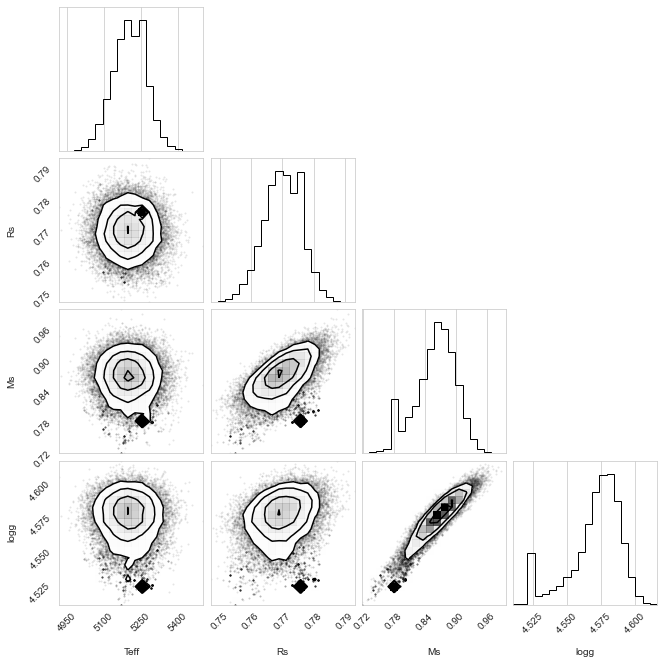

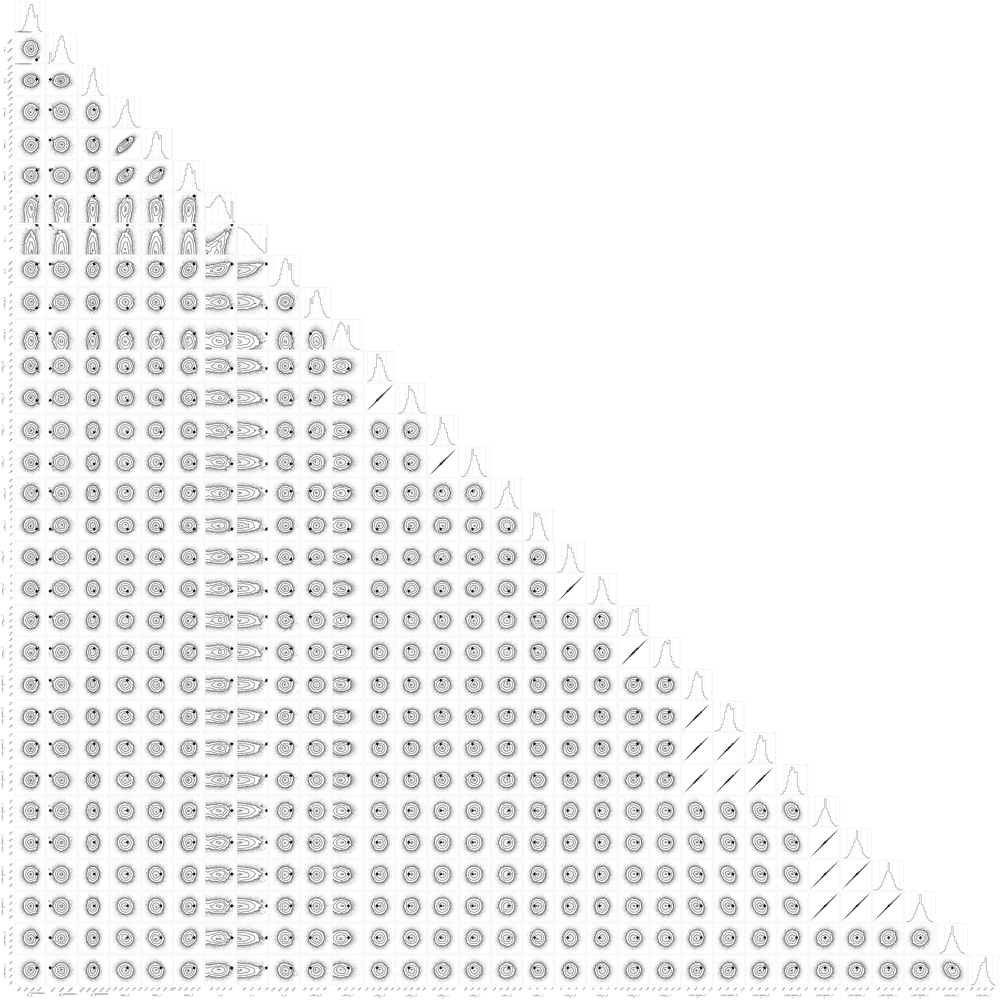

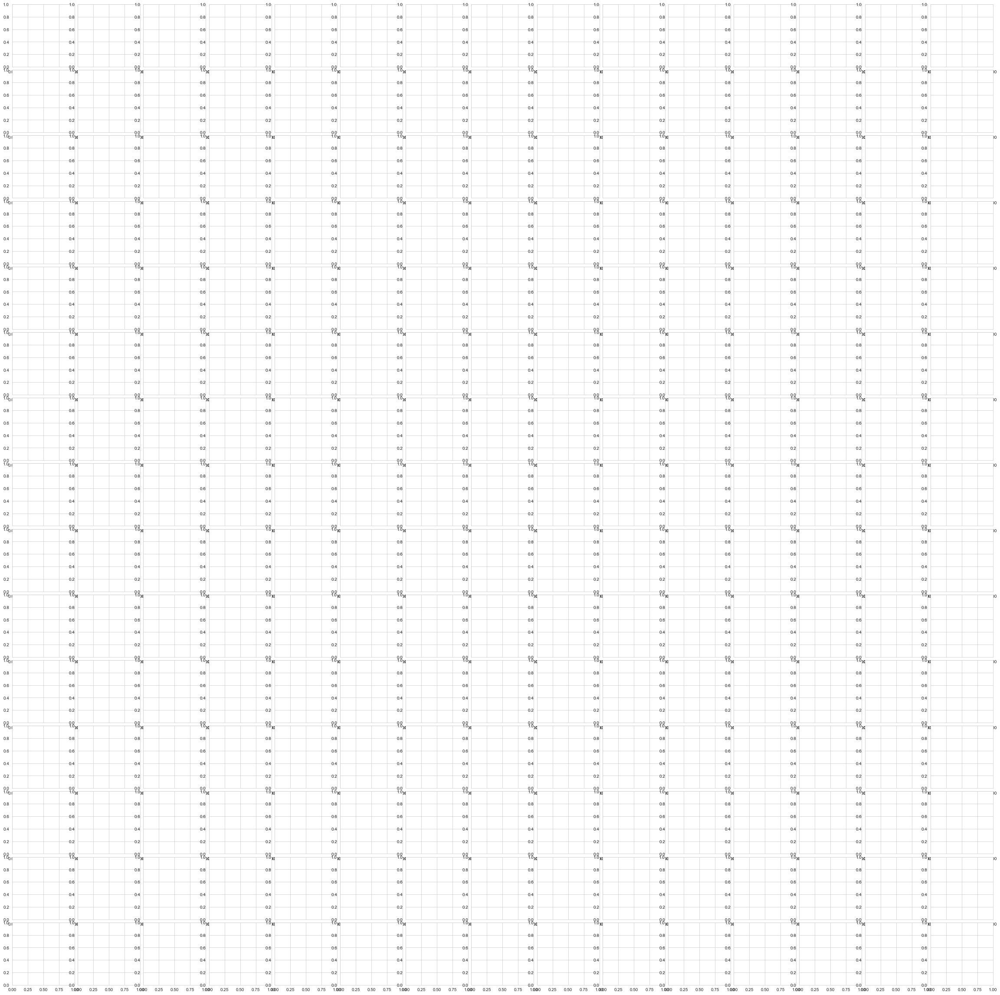

In [47]:
corner_groups={'star':['Teff','Rs','Ms','logg',],
               'transit':['t0','logror','b']+['u_star_'+sco.split('_')[0] for sco in all_scopes],
               'ttvs':['derived_period','transit_times_0','transit_times_1','transit_times_2']}
for scope in decor_scopes:
    corner_groups.update({scope:['mean_'+scope,'logs_phot_'+scope]+['dfd'+var+'_'+scope for var in incl_lin[scope]]+['d2fd'+var+'2_'+scope for var in incl_quad[scope]]})
    
from corner import corner
corners=[]
for submodel in corner_groups:
    corners+=[corner(pm.trace_to_dataframe(trace,varnames=corner_groups[submodel]))]

In [21]:
[var for var in trace.varnames if '__' not in var]

['logg',
 'transit_times_0',
 'transit_times_1',
 'transit_times_2',
 'period',
 'logs_phot_r_sex',
 'logs_phot_g_lco',
 'logs_phot_r_lco',
 'logs_phot_i_lco',
 'logs_phot_z_lco',
 'logs_phot_z_mcd',
 'logs_phot_cheops_0',
 'logs_phot_cheops_1',
 'logs_phot_cheops_2',
 'logs_phot_cheops_3',
 'logs_phot_tess',
 'mean_r_sex',
 'mean_g_lco',
 'mean_r_lco',
 'mean_i_lco',
 'mean_z_lco',
 'mean_z_mcd',
 'mean_cheops_0',
 'mean_cheops_1',
 'mean_cheops_2',
 'mean_cheops_3',
 'Teff',
 'Rs',
 'Ms',
 'logror',
 'ror',
 'r_pl',
 'b',
 'u_star_r_sex',
 'u_star_g_lco',
 'u_star_r_lco',
 'u_star_i_lco',
 'u_star_z_lco',
 'u_star_z_mcd',
 'u_star_cheops_0',
 'u_star_cheops_1',
 'u_star_cheops_2',
 'u_star_cheops_3',
 'u_star_tess',
 't0',
 'derived_period',
 'a_Rs',
 'sma',
 'S_in',
 'Tsurf_p',
 'tdur',
 'dfdairmass_r_sex',
 'dfdnorm_time_r_sex',
 'dfdwidth_r_sex',
 'dfdcompcounts_r_sex',
 'd2fdairmass2_r_sex',
 'dfdairmass_g_lco',
 'dfdnorm_time_g_lco',
 'dfdwidth_g_lco',
 'dfdcompcounts_g_lco',
 '

(-10.0, 10.0)

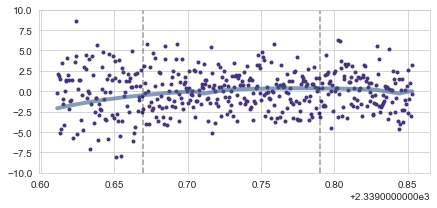

In [133]:
plt.figure(figsize=(7,3))
plt.plot(alldata['z_mcd']['time'],alldata['z_mcd']['flux'],'.')
pl_model=np.nanmedian(trace['flux_cor_z_mcd'] + np.sum(trace['planets_x_z_mcd'],2),axis=0)
plt.plot(alldata['z_mcd']['time'],pl_model,linewidth=4,alpha=0.6)
plt.plot([2339.67,2339.67],[-10,10],'--k',alpha=0.4)
plt.plot([2339.79,2339.79],[-10,10],'--k',alpha=0.4)
#plt.plot(alldata['z_mcd']['time'][102:-115],pl_model[102:-115]-1.5,'--k',alpha=0.4)
plt.ylim(-10,10)

2339.639969000127
2339.640503999777
2339.641024999786
2339.6415470000356
2339.6420599999838
2339.6425899998285
2339.643104999792
2339.6436270000413
2339.644148999825
2339.644687999971
2339.6452029999346


In [73]:
np.vstack((ttvs[pl]))[:,1]

array([0.02847242, 0.2211424 , 0.58204356, 0.69754373])

array([1762.66722683, 1938.29105968, 2359.78825853, 2394.91302511])

In [70]:
out

array([[ -0.75186936,  -1.41671525,   0.97340404, -13.51210356],
       [ -0.72361634,  -1.19275843,   1.56528812, -12.80010544],
       [ -0.69492452,  -0.97443045,   2.13749115, -12.1170161 ]])

In [59]:
for pl in range(3):
    print(np.nanmedian(trace['transit_times_'+str(pl)],axis=0))

[1743.71919919 1754.07738618 1930.12215893 1940.48015721 1950.83444049
 2333.95531194]
[1748.69405047 1937.82215685 2274.0831407 ]
[1762.66750897 1938.29219292 2359.79032963 2394.92237322]


In [63]:
comb_soln['t0']

array([1743.72755041, 1748.68905066, 1762.66690419])